# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [1]:
# if plotnine is not installed in Jupter then use the following command to install it 
!conda install -c conda-forge --yes plotnine

Solving environment: ...working... done

# All requested packages already installed.



Running this project require the following imports 

In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist


from sklearn.preprocessing import MinMaxScaler


from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage
import scipy.cluster.hierarchy as shc
from sklearn.preprocessing import normalize
from sklearn.neighbors import DistanceMetric



from sklearn.cluster import DBSCAN


from sklearn.mixture import GaussianMixture
import plotly.express as px


from sklearn.preprocessing import StandardScaler


from sklearn.decomposition import PCA
%matplotlib inline

In [3]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



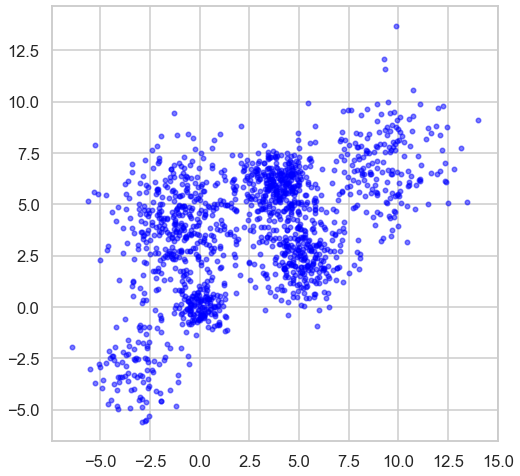

In [4]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

In [5]:
Multi_blob_Data

array([[-2.3542716 , -3.17974359],
       [-2.1580049 , -1.02006119],
       [-3.30439939, -3.30437804],
       ...,
       [ 9.86405669, 13.6746041 ],
       [ 5.457008  ,  9.9319843 ],
       [ 8.51133922,  7.48845914]])

In [6]:
#convert multiblob data to array and dataframe
array = np.array(Multi_blob_Data)
dataframe = pd.DataFrame(array)

In [7]:
array

array([[-2.3542716 , -3.17974359],
       [-2.1580049 , -1.02006119],
       [-3.30439939, -3.30437804],
       ...,
       [ 9.86405669, 13.6746041 ],
       [ 5.457008  ,  9.9319843 ],
       [ 8.51133922,  7.48845914]])

In [8]:
dataframe

,0,1
0,-2.354272,-3.179744
1,-2.158005,-1.020061
2,-3.304399,-3.304378
3,-0.947023,-2.002335
4,-3.610317,-2.294672
...,...,...
1445,9.240137,3.378037
1446,10.305952,7.366174
1447,9.864057,13.674604
1448,5.457008,9.931984


### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

# Kmeans to cluster the data 

In [9]:
#The distortion function is a measure of the sum of squared distances between each data point and its nearest cluster center. 
#The silhouette score is a measure of how similar each data point is to its own cluster compared to other clusters.
def kmeans_clustering(data):
    
    # Different K values to try starting from 2 to 7
    K = range(2, 7)

    # Empty lists to store results
    distortions = []
    silhouette_scores = []

    # K-means clustering with each value of K
    for k in K:
        kmeans_clustering = KMeans(n_clusters=k)
        kmeans_predict = kmeans_clustering.fit_predict(data)
    
        # Append distortion and silhouette score to lists
        distortions.append(kmeans_clustering.inertia_)
        silhouette_scores.append(silhouette_score(data, kmeans_predict))

        # Plot the clusters
        plt.scatter(data[:, 0], data[:, 1], c=kmeans_predict, s=50, cmap='viridis')
        plt.title("kmeans_clustering:K=" + str(k))
        plt.show()
        
    # Plot distortion function versus K
    plt.plot(K, distortions)
    plt.xlabel('Number of clusters (K)')
    plt.ylabel('Distortion')
    plt.title('Distortion function versus K')
    plt.show()

    # Plot silhouette score versus K
    plt.plot(K, silhouette_scores)
    plt.xlabel('Number of clusters (K)')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette score versus K')
    plt.show()

    # best K from silhouette score
    best_value_k = K[np.argmax(silhouette_scores)]
    print("Best K from silhouette score:", best_value_k)

    #best silhouette score
    best_silhouette_score=max(silhouette_scores)
    print("Best value of silhouette score:", best_silhouette_score)
    
    


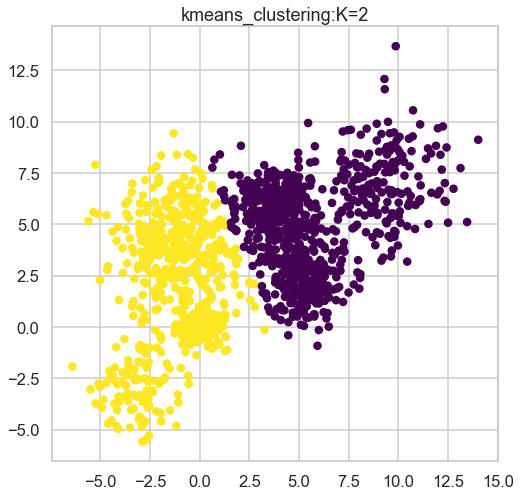

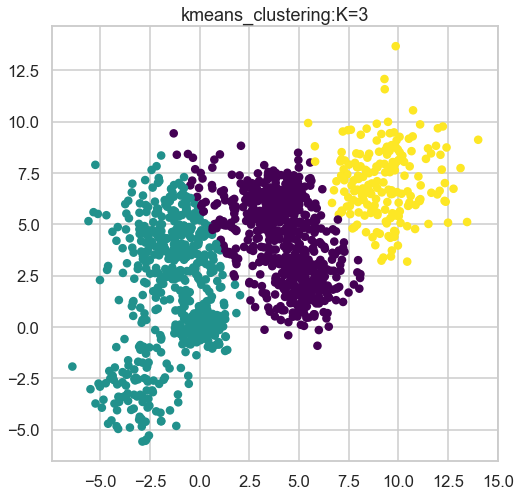

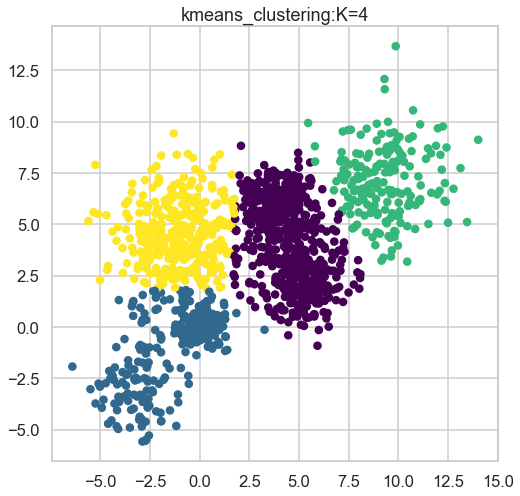

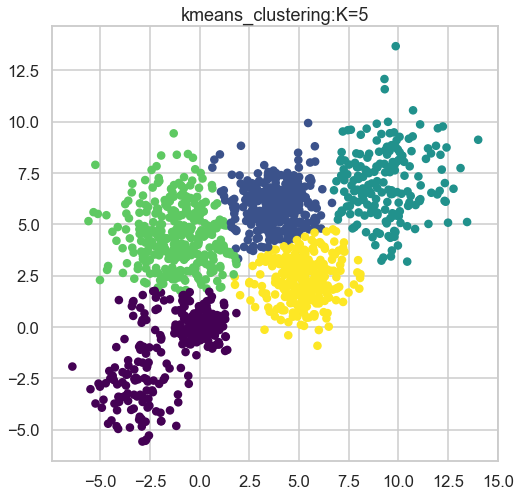

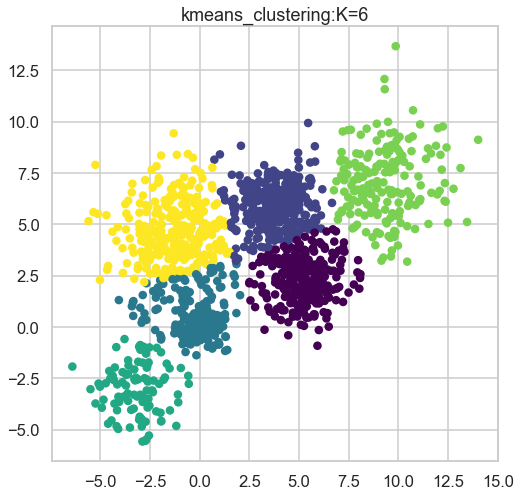

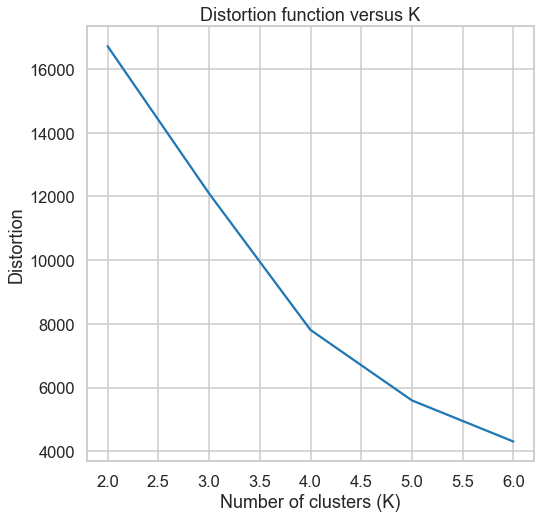

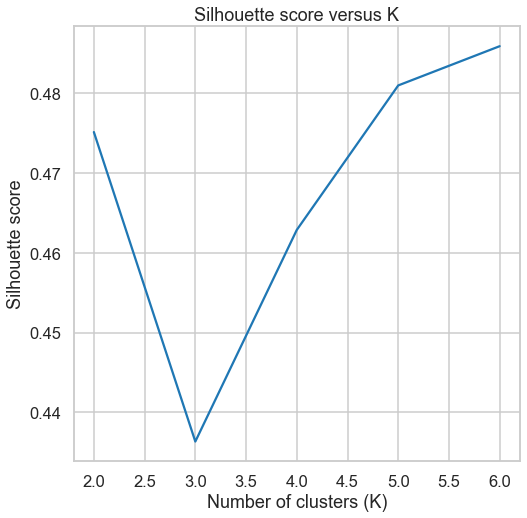

Best K from silhouette score: 6
Best value of silhouette score: 0.4859306805023632


In [10]:
kmeans_clustering(array)

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

# Agglomerative Clustering to cluster above data

In [11]:
def Hierarchal_clustering(data):
    
    
    #different affinities,linkages,and thresholds
    affinities = ['euclidean', 'cosine']
    linkages = ['average', 'single']
    distance_thresholds = [1.5, 2.0, 2.5]
    
    #empty array to store the number of clusters
    N_clusters = []

    #initialize parameters for best score values
    best_score = -1
    best_model = None
    
    #loop over different typer of affinities,linkages,and threshlods then apply clustering to different combinations
    for affinity in affinities:
        for linkage_method in linkages:
            for distance_threshold in distance_thresholds:
                Hierarchal = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage_method, distance_threshold=distance_threshold).fit(data)
           
                # Visualizing the clustering    
                plt.scatter(data[0], data[1], c = Hierarchal.fit_predict(data), cmap ='rainbow',s =13)
                plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(affinity,linkage_method,Hierarchal.n_clusters_))
                plt.show()
                
                #calculating silhouette score
                try:
                     score = silhouette_score(data, Hierarchal.fit_predict(data))
                except ValueError:
                    pass
            
                
                N_clusters.append(Hierarchal.n_clusters_)
                
                
                if score > best_score:
                    best_score = score
                    best_model = Hierarchal
                
                #visualizing the dendogram
                plt.figure(figsize=(10, 7))
                plt.title(f'Hierarchal Clustering (affinity={affinity}, linkage={linkage_method}, distance_threshold={distance_threshold},clusters={Hierarchal.n_clusters_},silhouette={score:.2f})')
                dendrogram(linkage(Hierarchal.children_, method=linkage_method, metric=affinity), truncate_mode='level', p=3)
                plt.xlabel("Number of points in node (or index of point if no parenthesis).")
                plt.show()
                print(f"Silhouette score: {score}")
                print(f"Number of clusters: {len(set(Hierarchal.labels_))}")
        
                
                
            
    print(f"Best Silhouette score: {best_score}")
    print(f"Number of clusters in best model: {len(set(best_model.labels_))}")

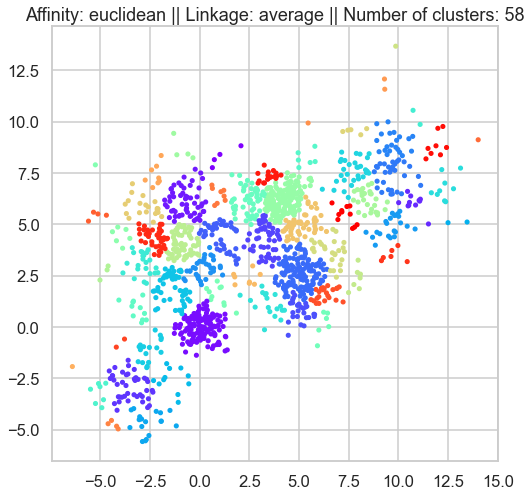

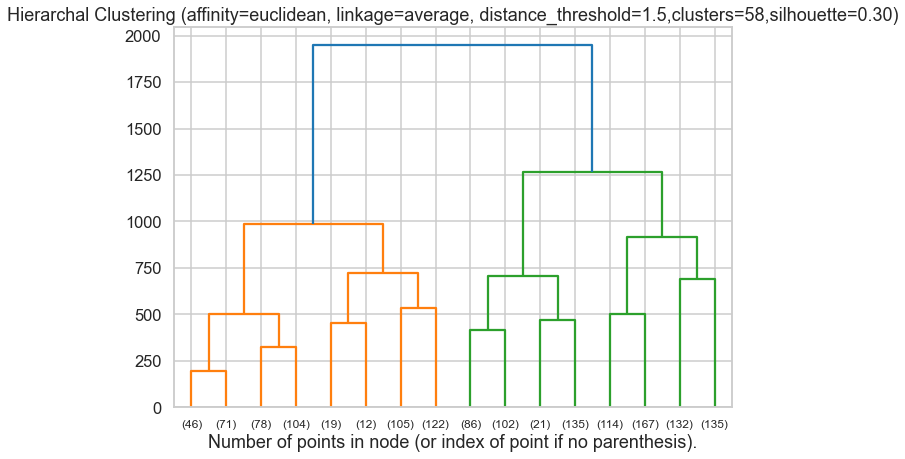

Silhouette score: 0.2955860015793413
Number of clusters: 58


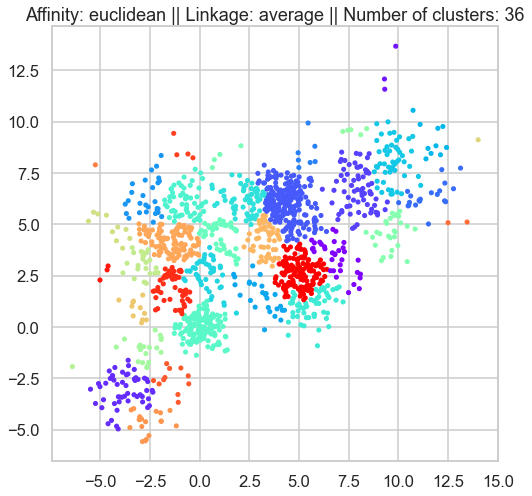

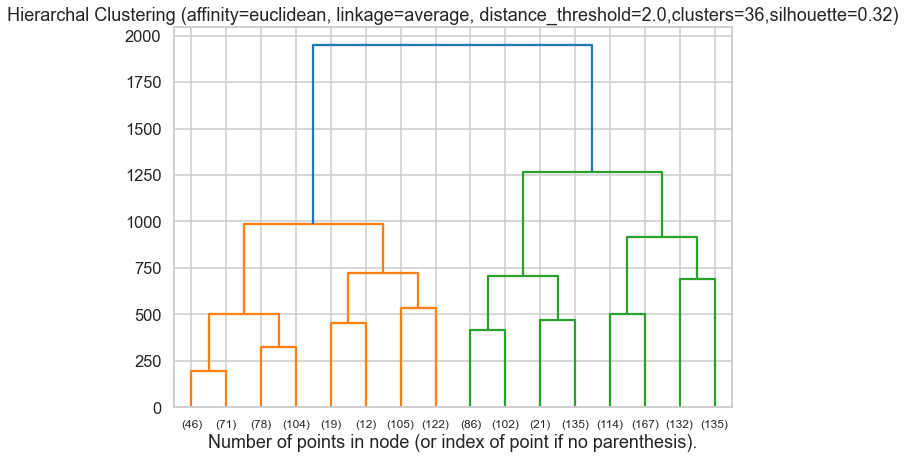

Silhouette score: 0.3155710172095083
Number of clusters: 36


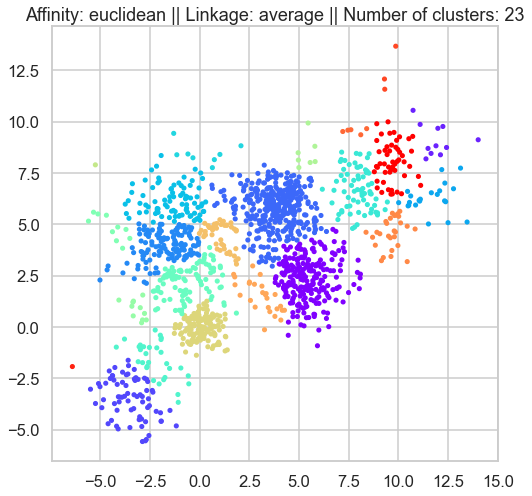

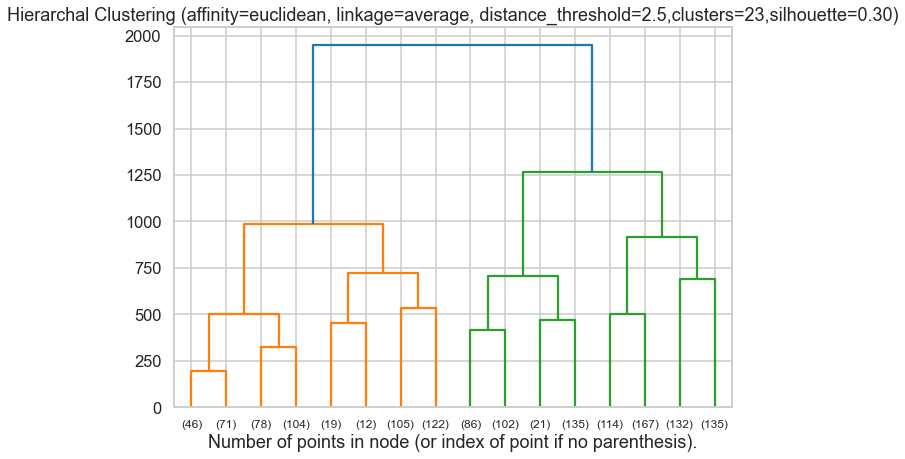

Silhouette score: 0.30335263855926
Number of clusters: 23


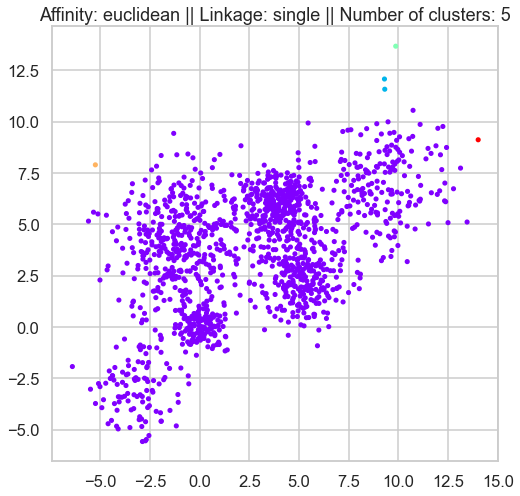

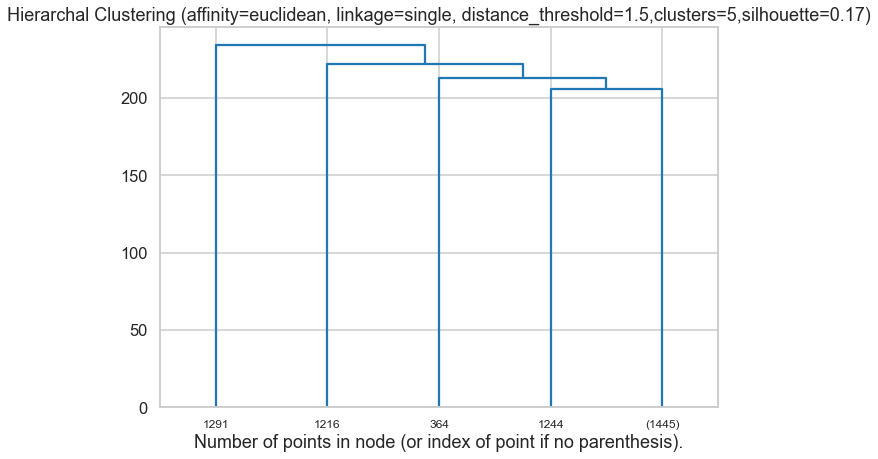

Silhouette score: 0.17400752332621522
Number of clusters: 5


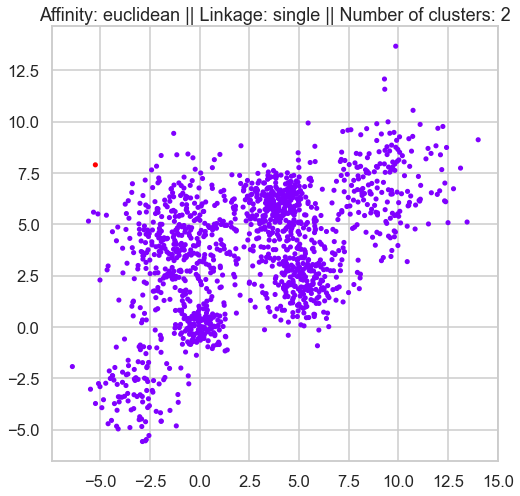

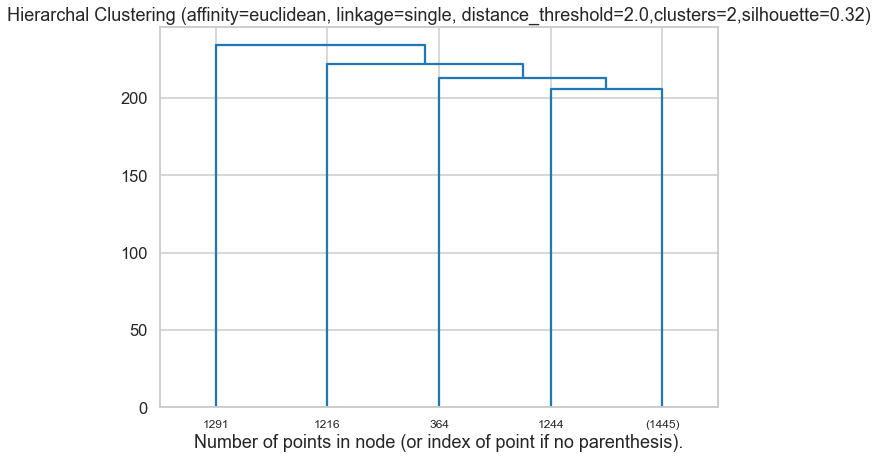

Silhouette score: 0.3218066204847175
Number of clusters: 2


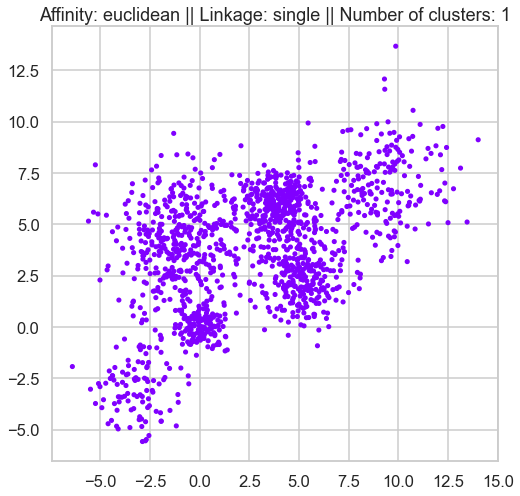

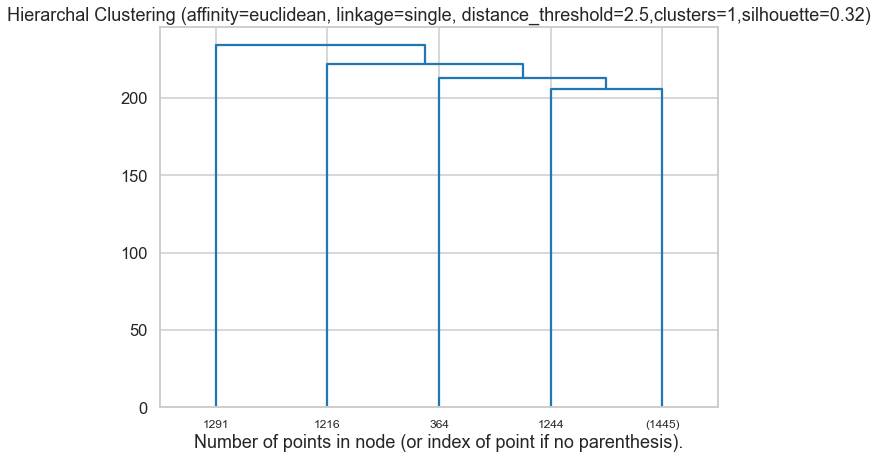

Silhouette score: 0.3218066204847175
Number of clusters: 1


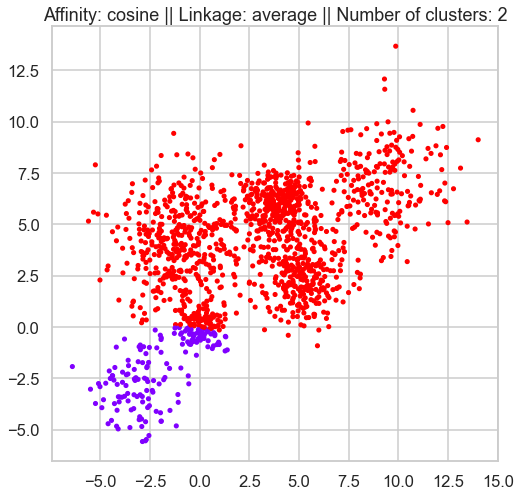

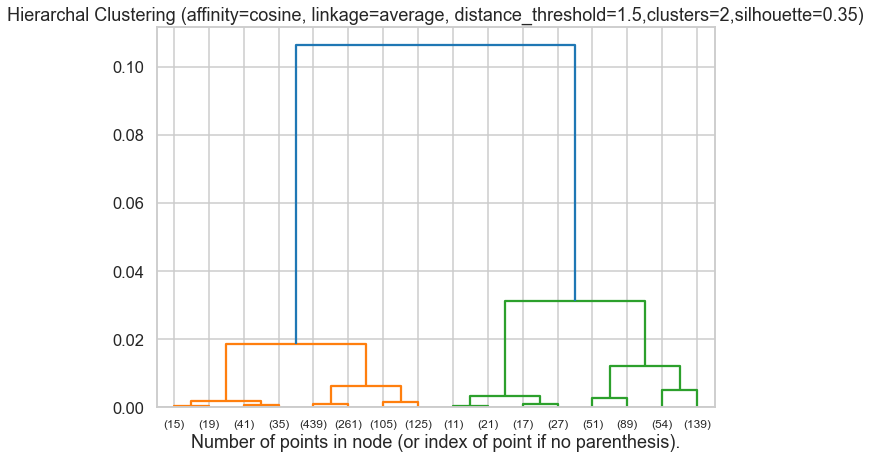

Silhouette score: 0.35251834131557364
Number of clusters: 2


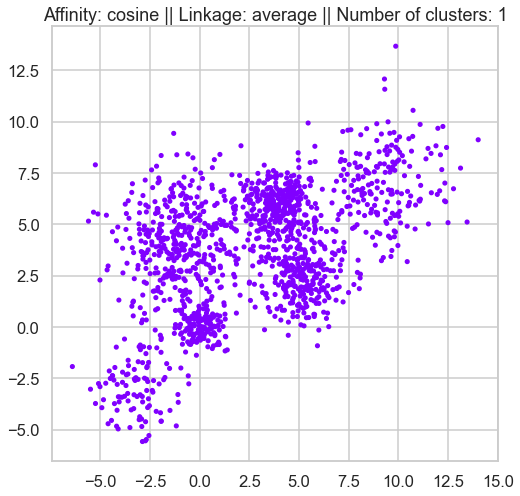

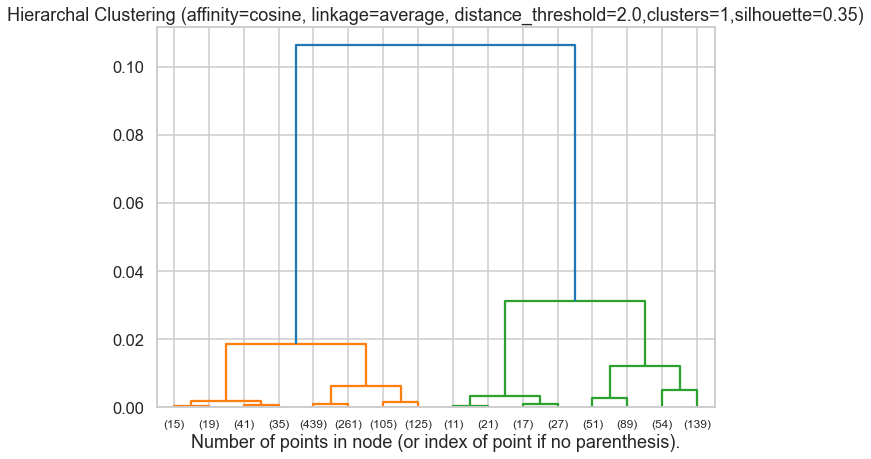

Silhouette score: 0.35251834131557364
Number of clusters: 1


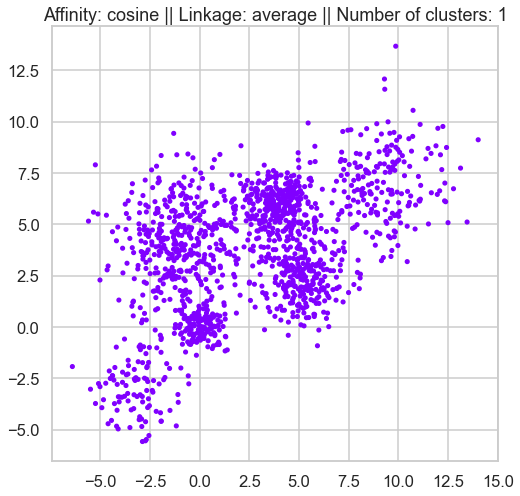

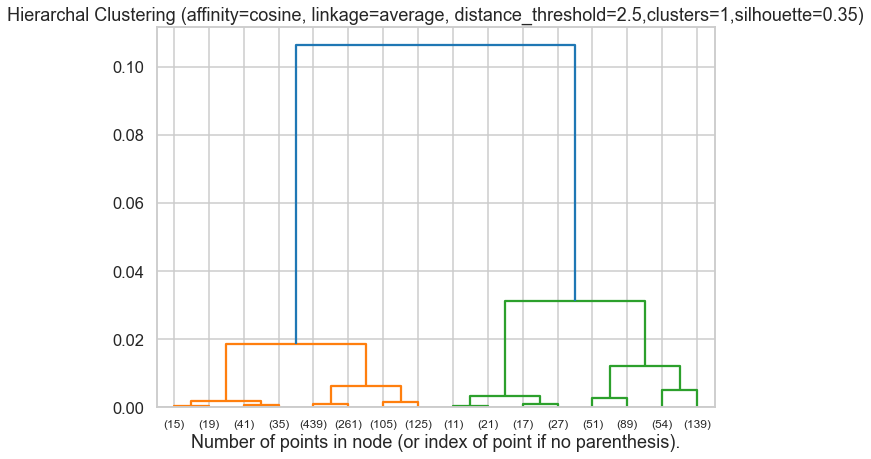

Silhouette score: 0.35251834131557364
Number of clusters: 1


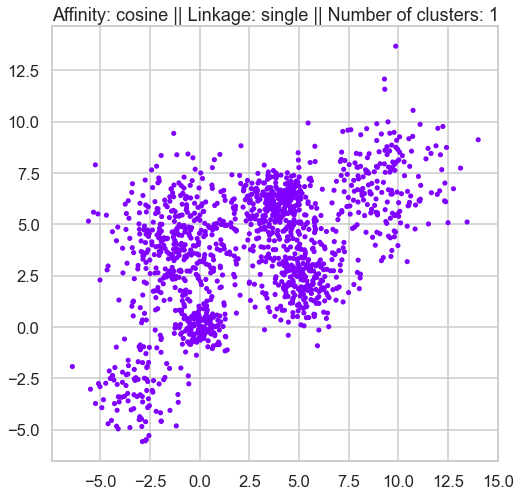

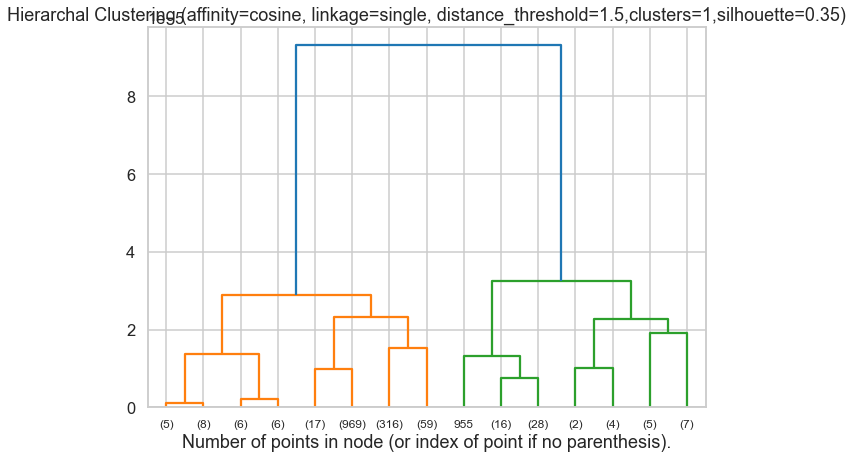

Silhouette score: 0.35251834131557364
Number of clusters: 1


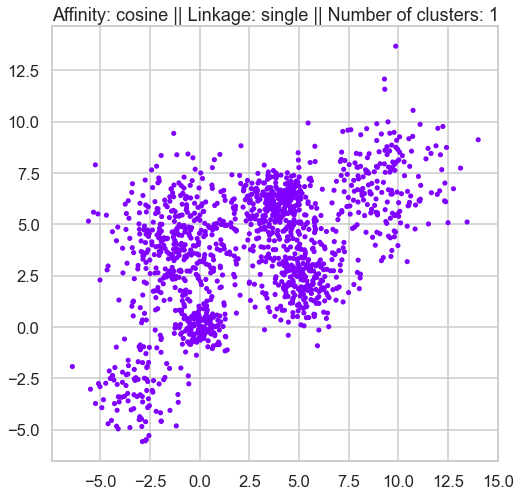

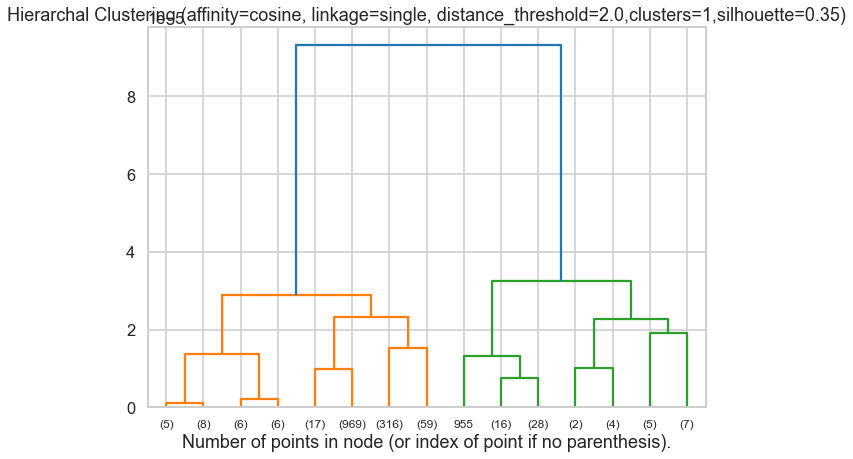

Silhouette score: 0.35251834131557364
Number of clusters: 1


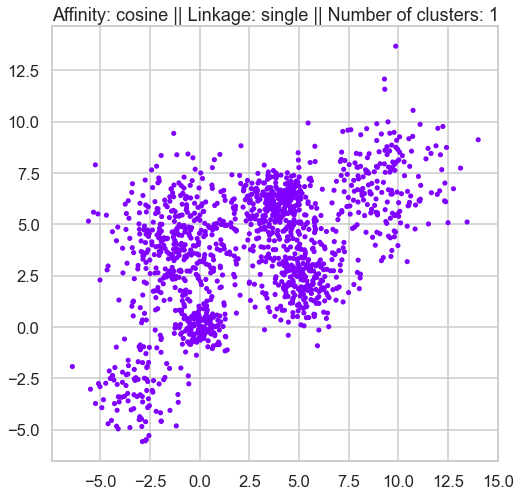

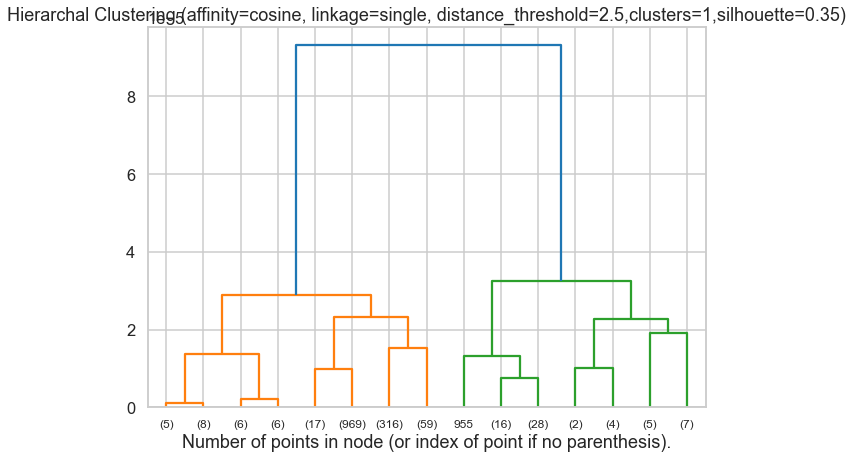

Silhouette score: 0.35251834131557364
Number of clusters: 1
Best Silhouette score: 0.35251834131557364
Number of clusters in best model: 2


In [12]:
Hierarchal_clustering(dataframe)

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

In [13]:
def DBScan_clustering(data):
    
    #change the parameters EPS (from 0.1 to 3),Min_samples (from 5 to 25)
    Eps = np.arange(0.1, 3.1, 0.1)
    Min_samples = range(5, 26)
    
    #empty array to store silhouette scores
    score=[]
    best_score = -1
    
    # Compute silhouette scores for all combinations of parameters
    silhouette_scores = np.zeros((len(Eps), len(Min_samples)))
    
    #loop over different parameters and compute dbscan algorithm and calculate silhouette score
    for i,eps in enumerate(Eps):
        for j,min_samples in enumerate(Min_samples):
            
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            dbscan_predict = dbscan.fit_predict(data)
            
            if len(np.unique(dbscan_predict)) == 1:
                continue
            
            #calculate silhouette score and add it in the zeros array for graphing purpose
            silhouette_scores[i, j]  = silhouette_score(data, dbscan_predict)
            
            #calculate silhouette score 
            scores=silhouette_score(data, dbscan_predict)
            score.append(scores)
            
            
            
            if scores > best_score:
                best_score = scores
                best_eps = eps
                best_min_samples = min_samples
            


    print("Best silhouette score:", best_score)
    print("Best eps:", best_eps)
    print("Best min_samples:", best_min_samples)
    
    

    # Plot silhouette scores for all combinations of parameters
    fig, ax = plt.subplots(figsize=(20, 12))
    im = ax.imshow(silhouette_scores, cmap='coolwarm')
    ax.set_xticks(np.arange(len(Min_samples)))
    ax.set_yticks(np.arange(len(Eps)))
    ax.set_xticklabels(Min_samples)
    ax.set_yticklabels(["{:.1f}".format(e) for e in Eps])
    ax.set_xlabel("Min Samples")
    ax.set_ylabel("Eps")
    ax.set_title("Silhouette Scores for DBSCAN Clustering")
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Silhouette Score", rotation=-90, va="bottom")
    plt.show()
    
    #calculate dbscan for best parameters
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
    dbscan_predict = dbscan.fit_predict(data)

    # Number of Clusters for best eps and best min_samples
    N_clusters =len(set(dbscan_predict))-(1 if -1 in dbscan_predict else 0)
    print('Estimated number of clusters {} '.format(N_clusters) )

    plt.scatter(data[0], data[1], c=dbscan_predict, cmap='viridis')
    plt.title("DBSCAN Clustering with Best Parameters (Silhouette Score: {:.2f})".format(best_score))
    plt.show()
    
    
    #plotting silhouette score vs different combinations of eps and min_samples
    plt.plot(score)
    plt.title("Silhouette Scores")
    plt.xlabel("Parameter Combination")
    plt.ylabel("Score")
    plt.show()

Best silhouette score: 0.4685207355522043
Best eps: 2.1
Best min_samples: 6


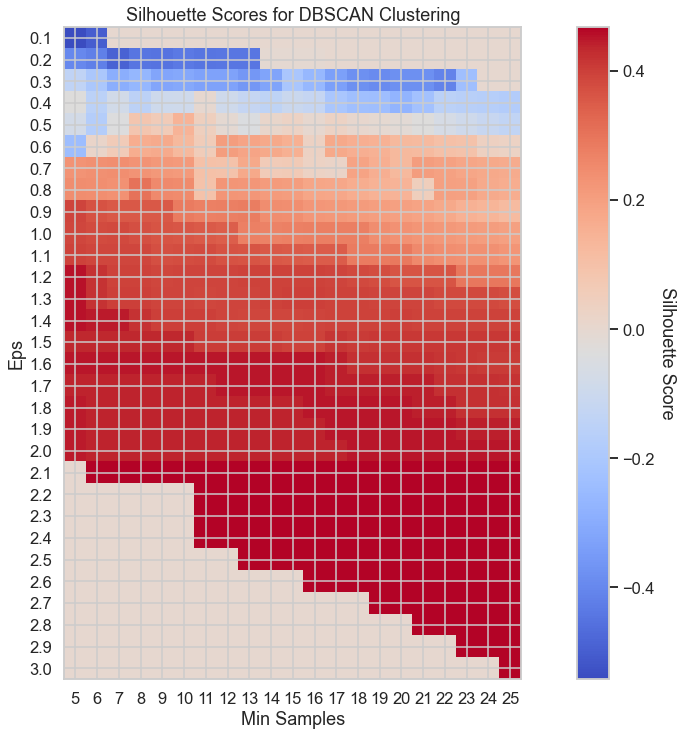

Estimated number of clusters 1 


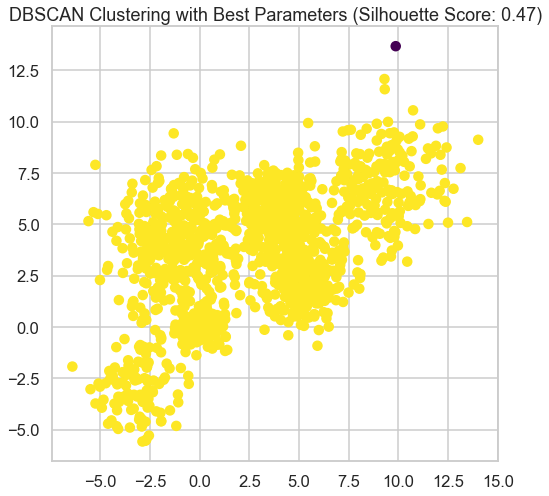

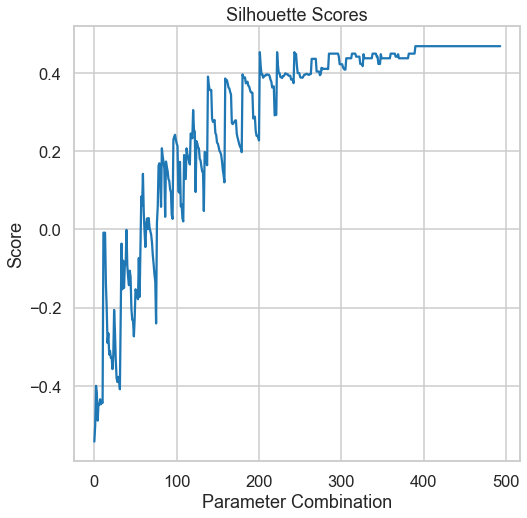

In [14]:
DBScan_clustering(dataframe)

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

In [15]:
### To get probability I can use verbose=2, but this will only output log probability (as per documentation)
### So Iwill have to convert to probability by using this equation e^(log_prob)/(1+e^{log_prob)
### Alternatively, I use the predict_proba method to compute the components' density for each sample.
### For the 2D contours the contour output might not be shown properly because it needs to be run. 

def Gaussian_Mixture(data,covariance):
    
    gmm = GaussianMixture(n_components = 4, covariance_type=covariance)
    gmm.fit(data)
    
    # Calculating the probability density and storing in df
    probs = gmm.predict_proba(data)
    
   
    probs_df = pd.DataFrame(probs)
        
    # Assign a label to each sample
    labels = gmm.predict(data)
    data['labels'] = labels
    data0 = data[data['labels']== 0]
    data1 = data[data['labels']== 1]
    data2 = data[data['labels']== 2]
    data3 = data[data['labels']== 3]
        
    fig = plt.figure(figsize=(25,25))
    fig.suptitle('Plots for the 4 Mixture Components with {} covariance'.format(covariance),fontsize=30)
    fig.subplots_adjust(top=0.95)
    
    # Plotting three clusters in same plot
    plt.subplot(2, 2, 1)
    plt.scatter(data0[0], data0[1], c ='b',s=25)
    plt.scatter(data1[0], data1[1], c ='orange',s=25)
    plt.scatter(data2[0], data2[1], c ='g',s=25)
    plt.scatter(data3[0], data3[1], c ='r',s=25)
    plt.title('Scatter plot of the Mixture Components')
    
    # Visualizing Resultant Distributions
    plt.subplot(2, 2, 2)
    sns.kdeplot(data=probs_df).set(title=' Desnsity plot of the mixture components')
    plt.show()
    
    # 2D Contour plot of resultant Resultant Distributions
    fig = px.density_contour(probs_df)
    fig.update_traces(contours_coloring="fill",contours_showlabels = True) 
    fig.update_layout(title_text='2D Contour Plot of Resultant Distributions', title_x=0.5)
    fig.show()


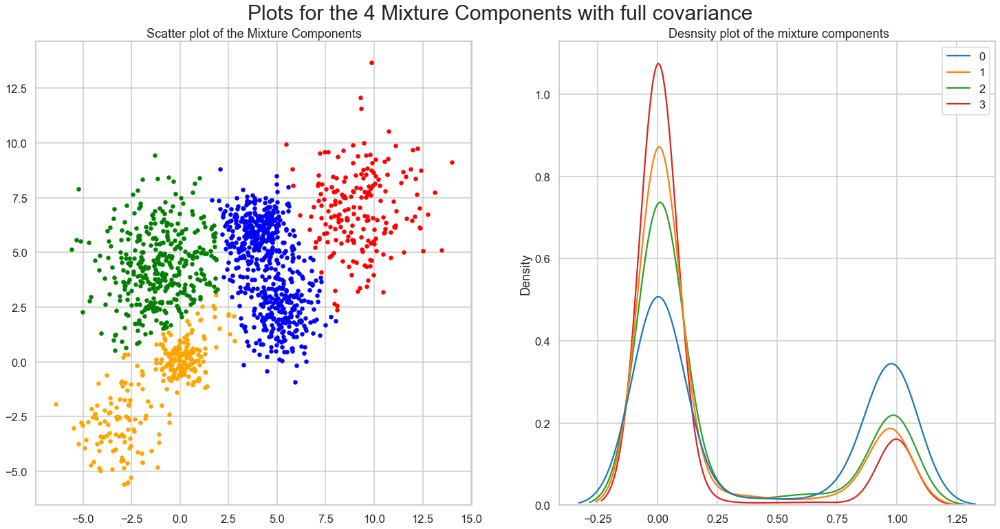

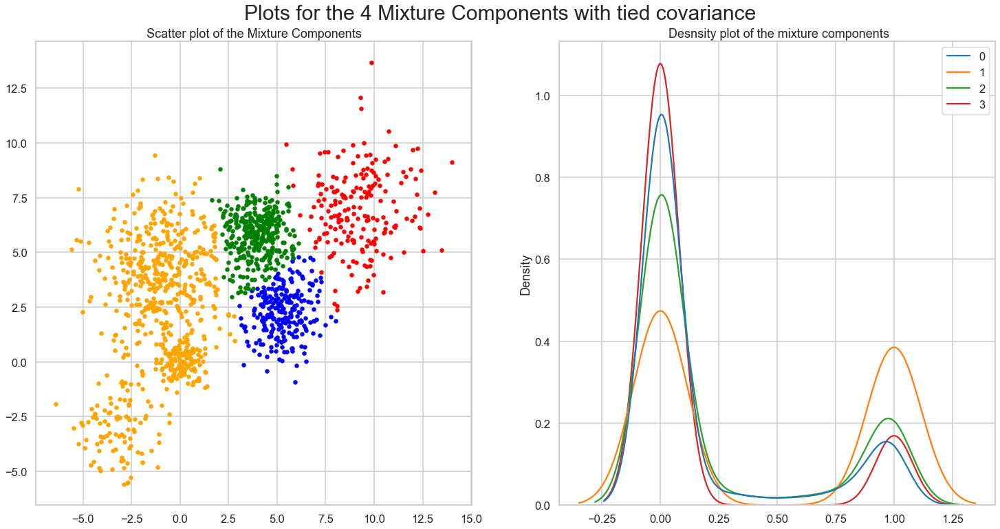

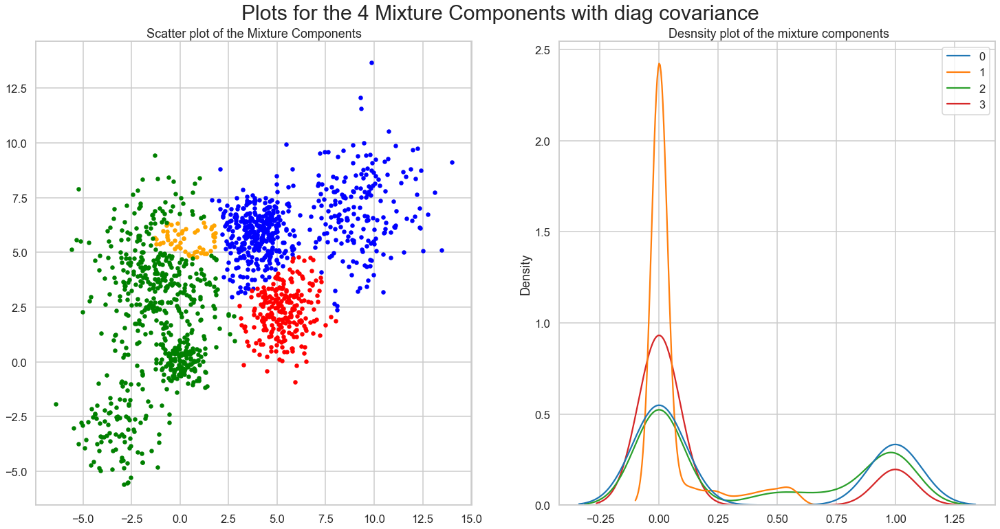

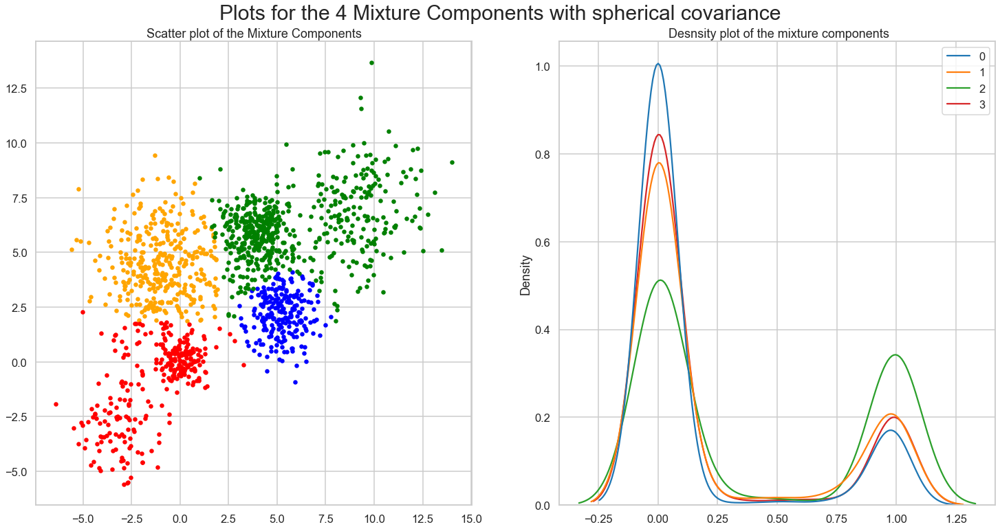

In [16]:
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_Mixture(dataframe,covars)

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [17]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']

['setosa', 'versicolor', 'virginica']

In [18]:
iris_data

{'data': array([[5.1, 3.5, 1.4, 0.2],
        [4.9, 3. , 1.4, 0.2],
        [4.7, 3.2, 1.3, 0.2],
        [4.6, 3.1, 1.5, 0.2],
        [5. , 3.6, 1.4, 0.2],
        [5.4, 3.9, 1.7, 0.4],
        [4.6, 3.4, 1.4, 0.3],
        [5. , 3.4, 1.5, 0.2],
        [4.4, 2.9, 1.4, 0.2],
        [4.9, 3.1, 1.5, 0.1],
        [5.4, 3.7, 1.5, 0.2],
        [4.8, 3.4, 1.6, 0.2],
        [4.8, 3. , 1.4, 0.1],
        [4.3, 3. , 1.1, 0.1],
        [5.8, 4. , 1.2, 0.2],
        [5.7, 4.4, 1.5, 0.4],
        [5.4, 3.9, 1.3, 0.4],
        [5.1, 3.5, 1.4, 0.3],
        [5.7, 3.8, 1.7, 0.3],
        [5.1, 3.8, 1.5, 0.3],
        [5.4, 3.4, 1.7, 0.2],
        [5.1, 3.7, 1.5, 0.4],
        [4.6, 3.6, 1. , 0.2],
        [5.1, 3.3, 1.7, 0.5],
        [4.8, 3.4, 1.9, 0.2],
        [5. , 3. , 1.6, 0.2],
        [5. , 3.4, 1.6, 0.4],
        [5.2, 3.5, 1.5, 0.2],
        [5.2, 3.4, 1.4, 0.2],
        [4.7, 3.2, 1.6, 0.2],
        [4.8, 3.1, 1.6, 0.2],
        [5.4, 3.4, 1.5, 0.4],
        [5.2, 4.1, 1.5, 0.1],
  

In [19]:
#converting the array to a dataframe
df = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)

#remaing the columns of tha dataframe starting 0 to 3
df_rename = df.rename(columns={"sepal length (cm)":0,'sepal width (cm)':1,'petal length (cm)':2,'petal width (cm)':3})
df_rename.head()

,0,1,2,3
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


# Kmeans for iris dataset

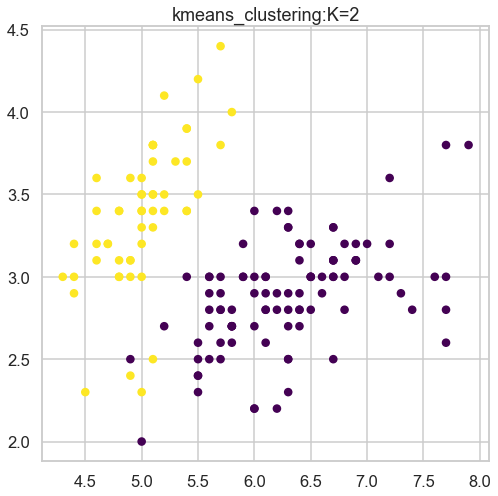

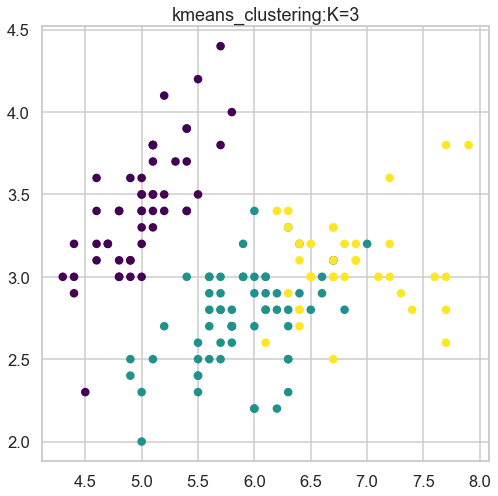

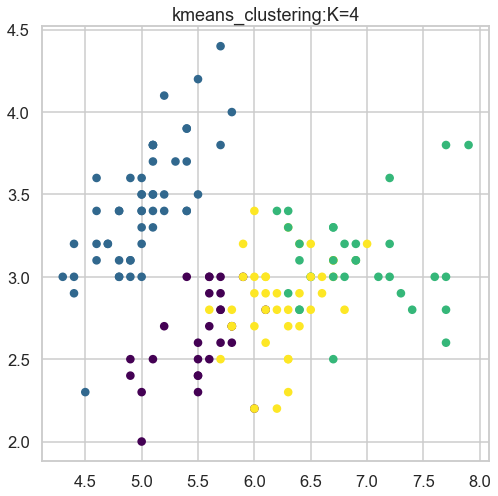

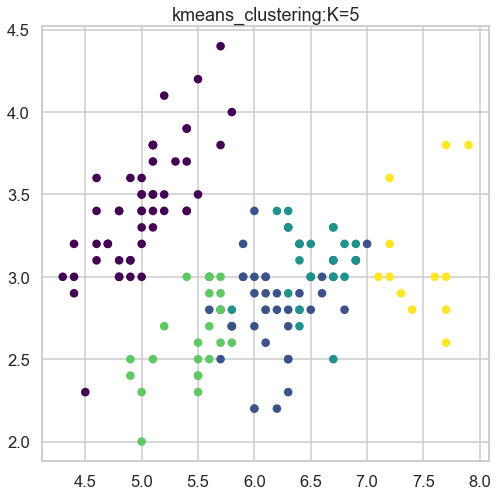

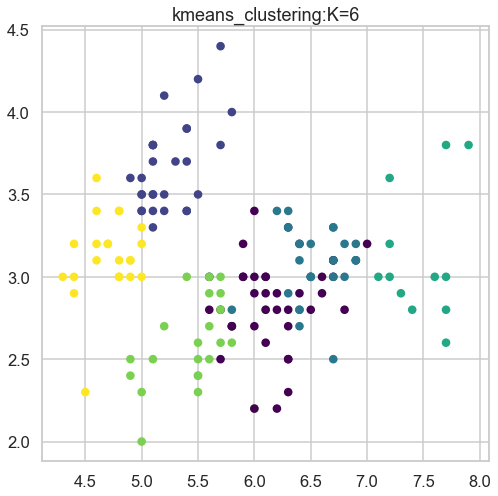

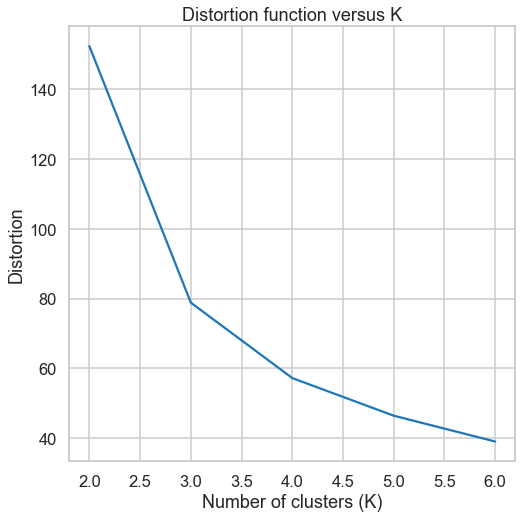

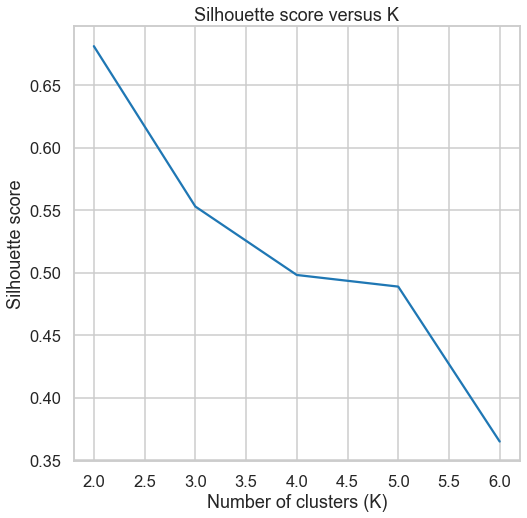

Best K from silhouette score: 2
Best value of silhouette score: 0.6810461692117462


In [20]:
kmeans_clustering(iris_data.data)

# Hierarchal Clustering

# Agglomerative Clustering to cluster iris dataset

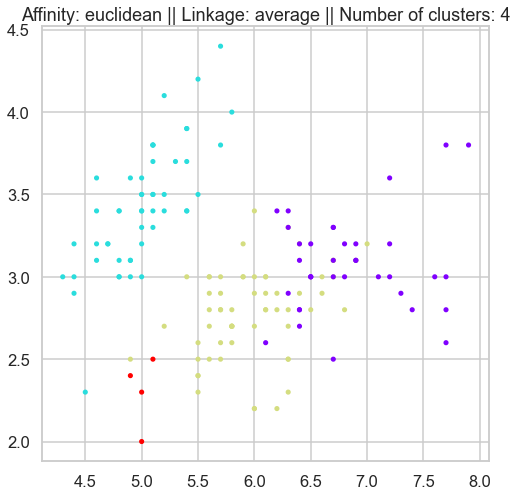

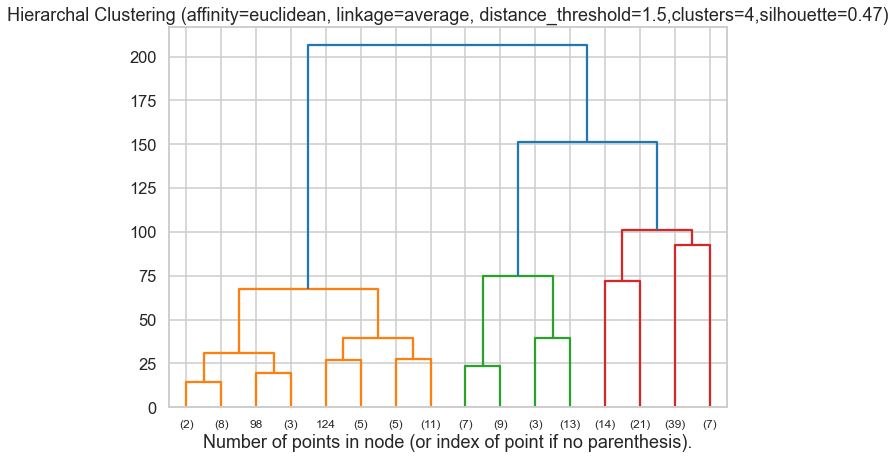

Silhouette score: 0.4719936084994261
Number of clusters: 4


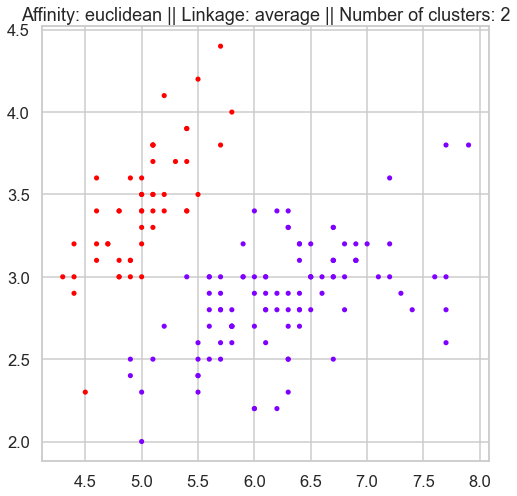

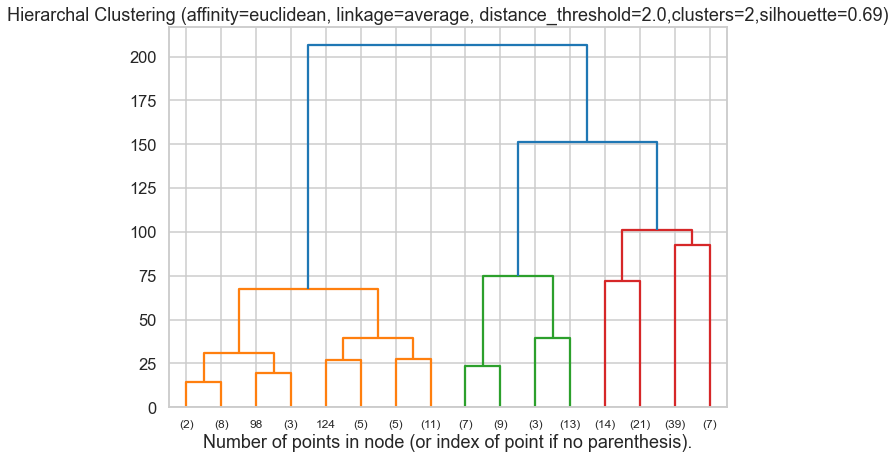

Silhouette score: 0.6867350732769781
Number of clusters: 2


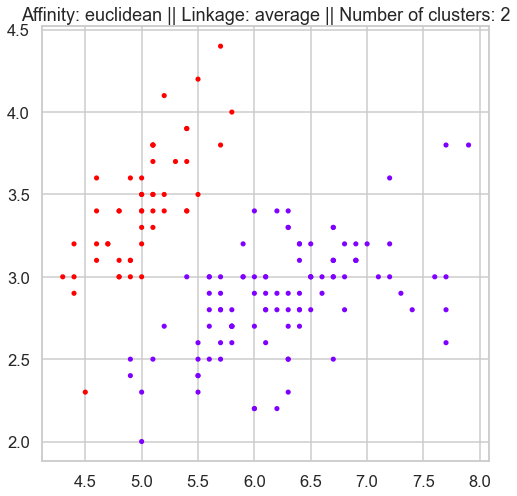

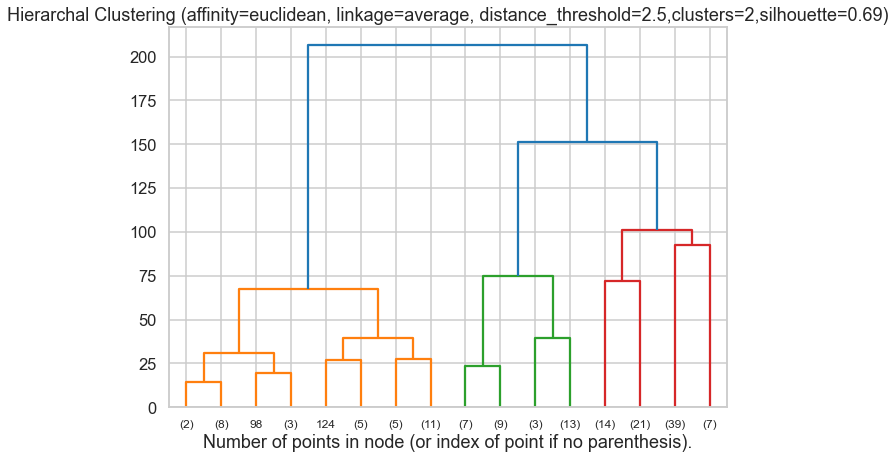

Silhouette score: 0.6867350732769781
Number of clusters: 2


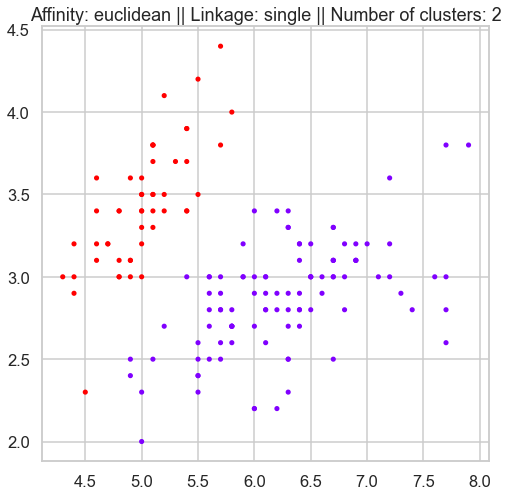

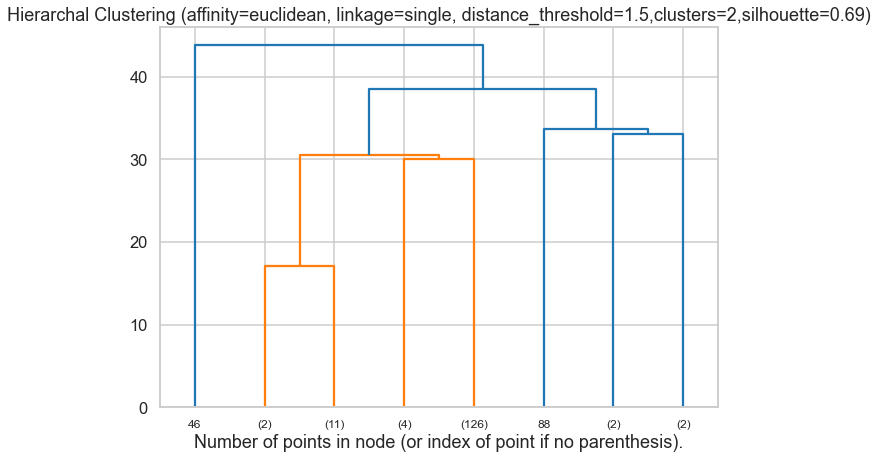

Silhouette score: 0.6867350732769781
Number of clusters: 2


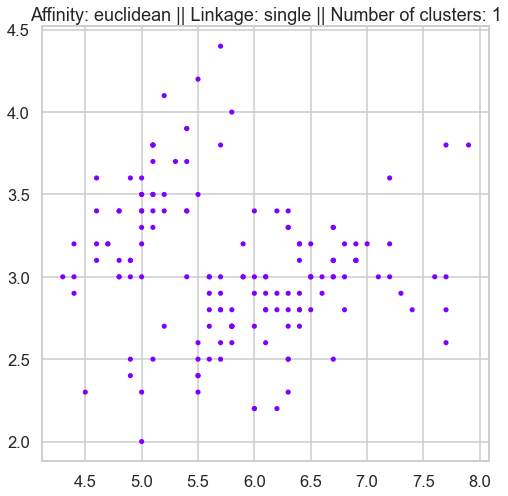

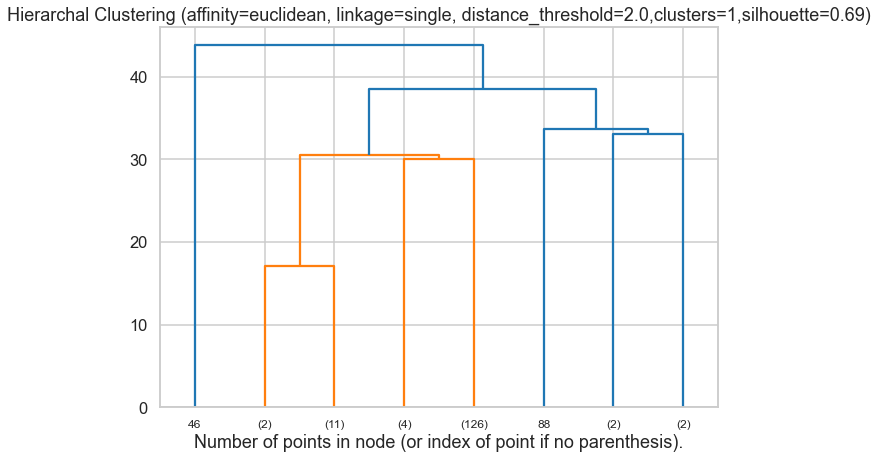

Silhouette score: 0.6867350732769781
Number of clusters: 1


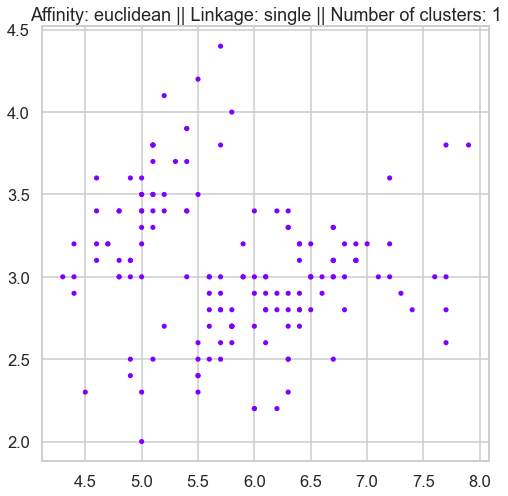

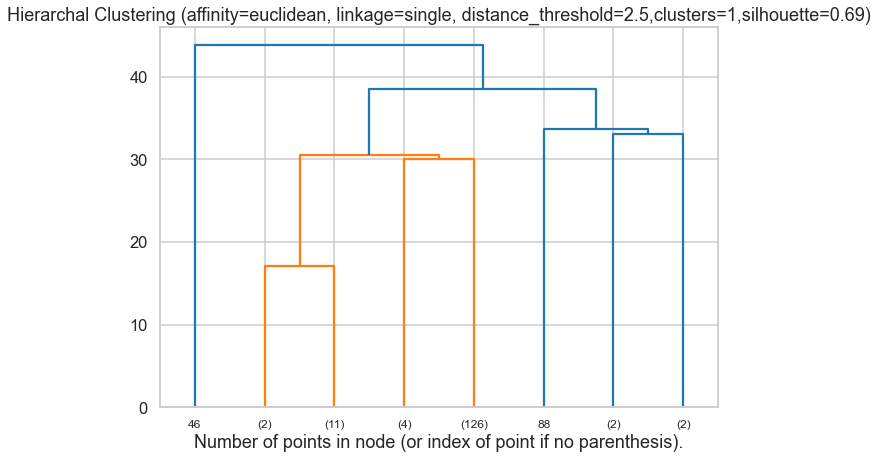

Silhouette score: 0.6867350732769781
Number of clusters: 1


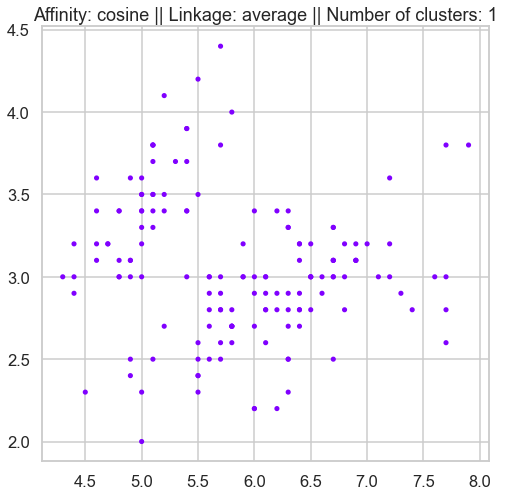

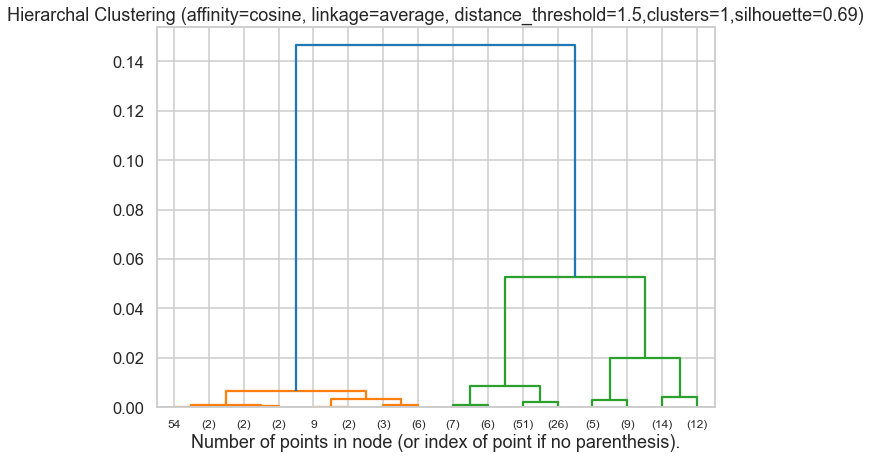

Silhouette score: 0.6867350732769781
Number of clusters: 1


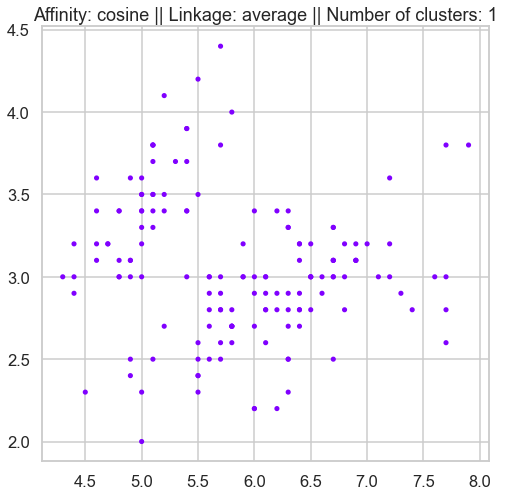

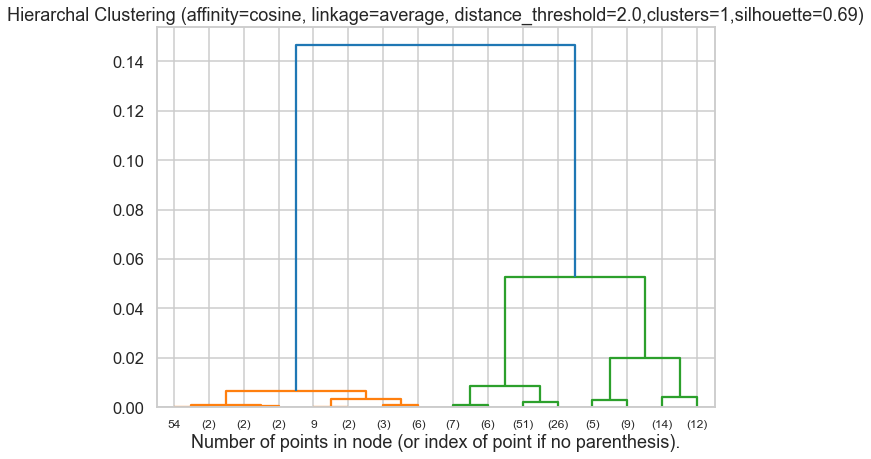

Silhouette score: 0.6867350732769781
Number of clusters: 1


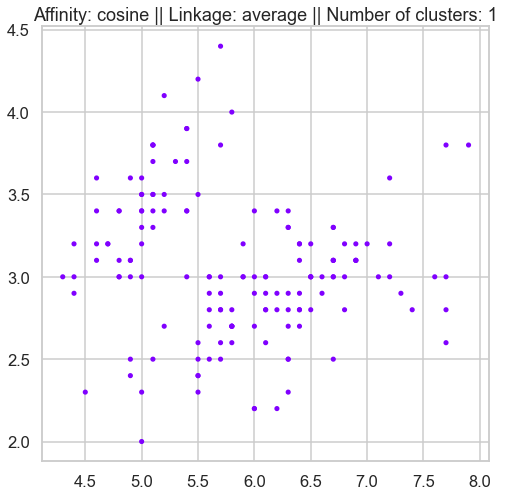

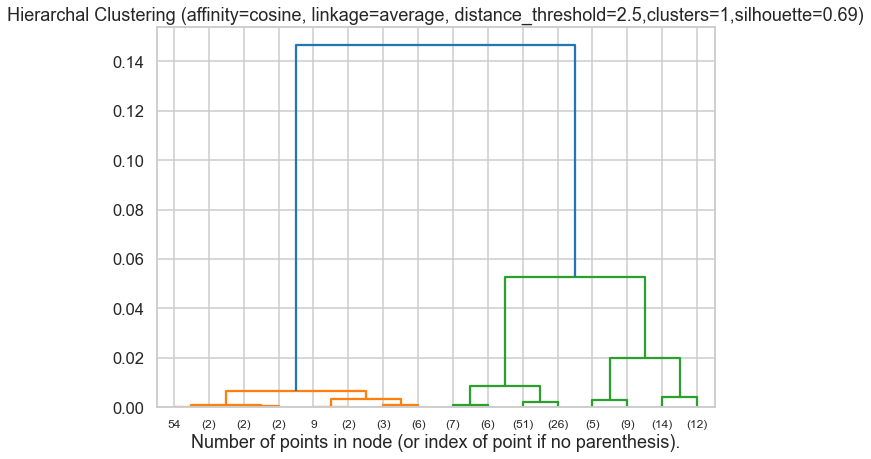

Silhouette score: 0.6867350732769781
Number of clusters: 1


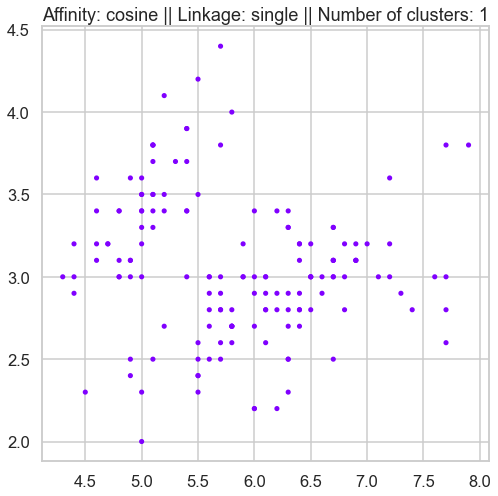

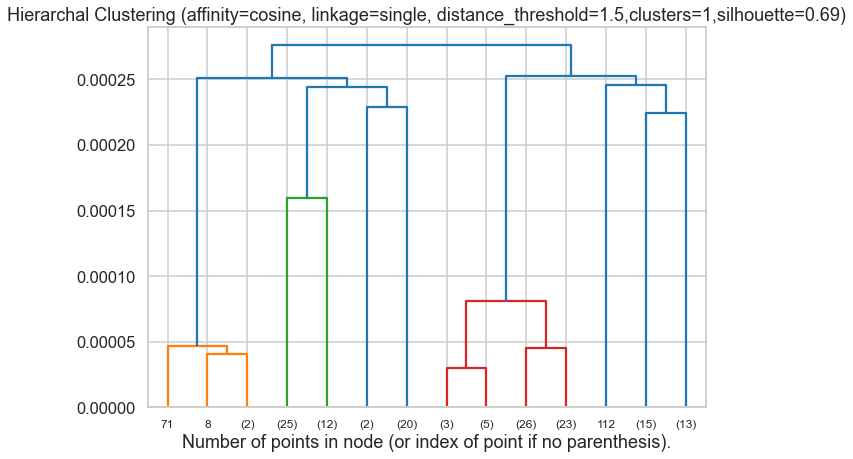

Silhouette score: 0.6867350732769781
Number of clusters: 1


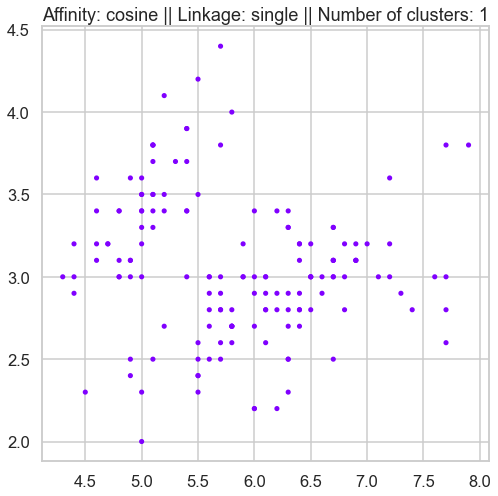

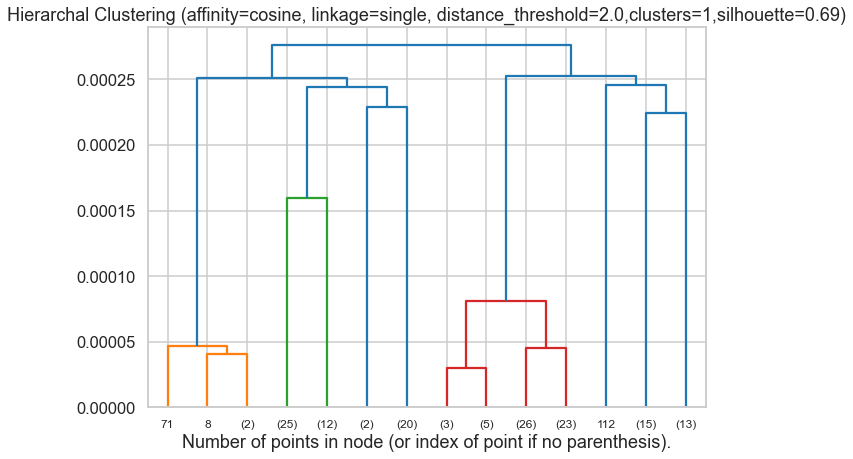

Silhouette score: 0.6867350732769781
Number of clusters: 1


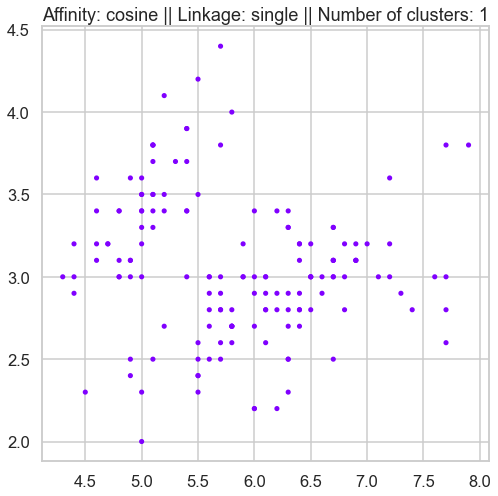

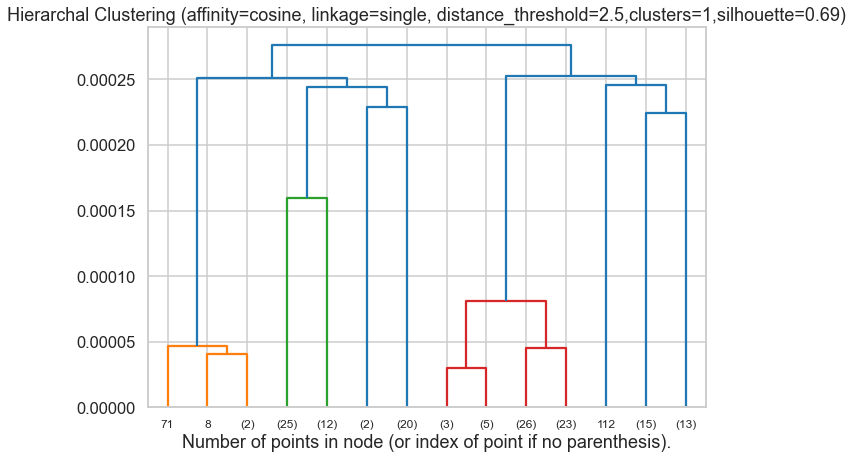

Silhouette score: 0.6867350732769781
Number of clusters: 1
Best Silhouette score: 0.6867350732769781
Number of clusters in best model: 2


In [21]:
Hierarchal_clustering(df_rename)

# DBSCAN

Best silhouette score: 0.6867350732769781
Best eps: 0.9
Best min_samples: 5


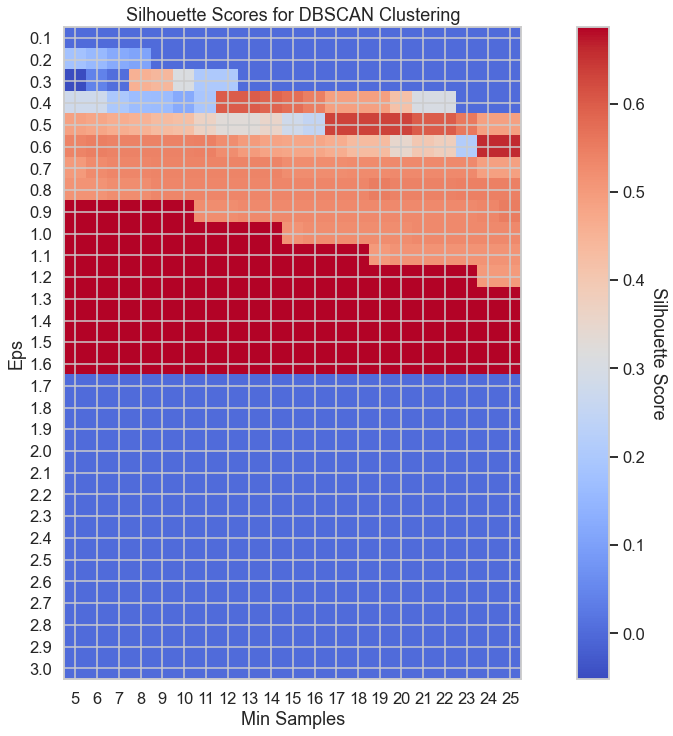

Estimated number of clusters 2 


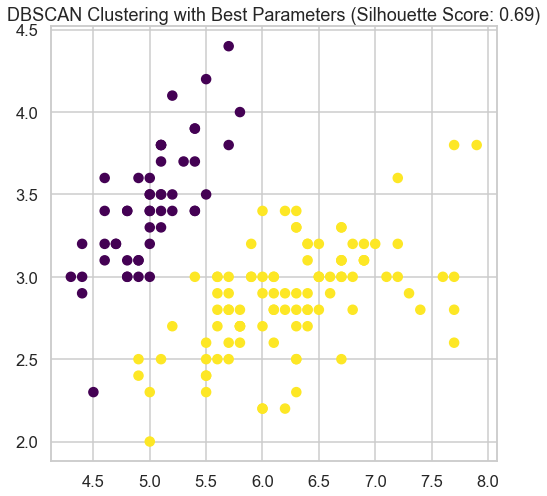

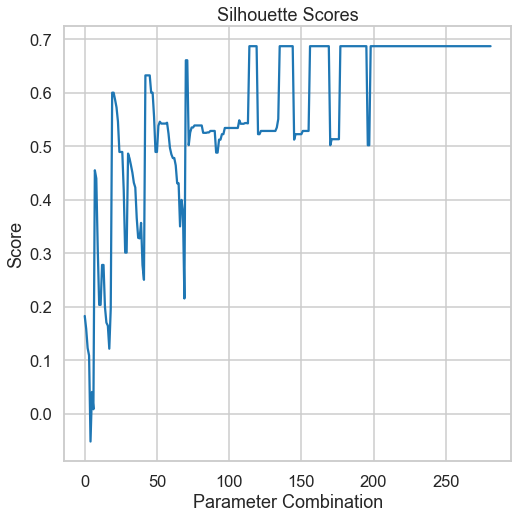

In [22]:
DBScan_clustering(df_rename)

# Gaussian Mixture

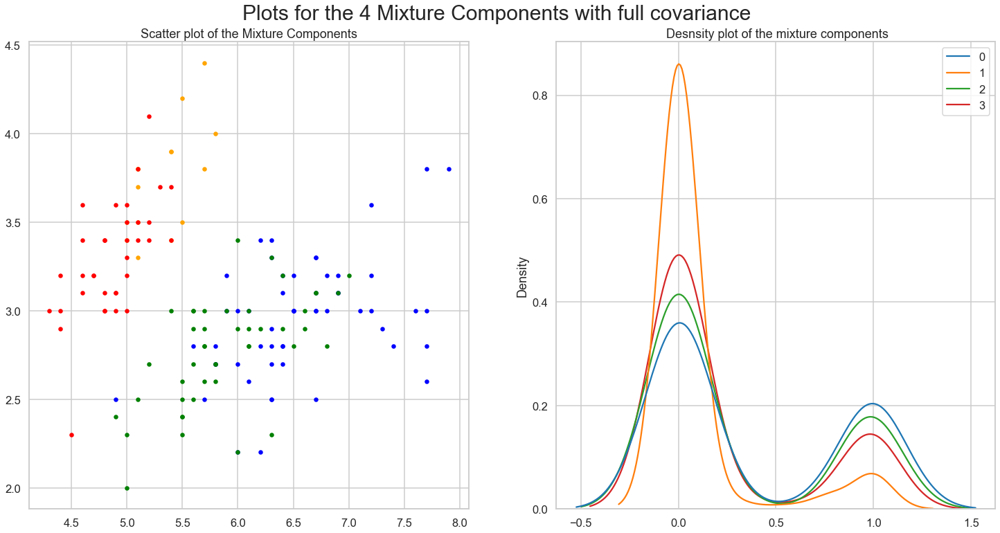

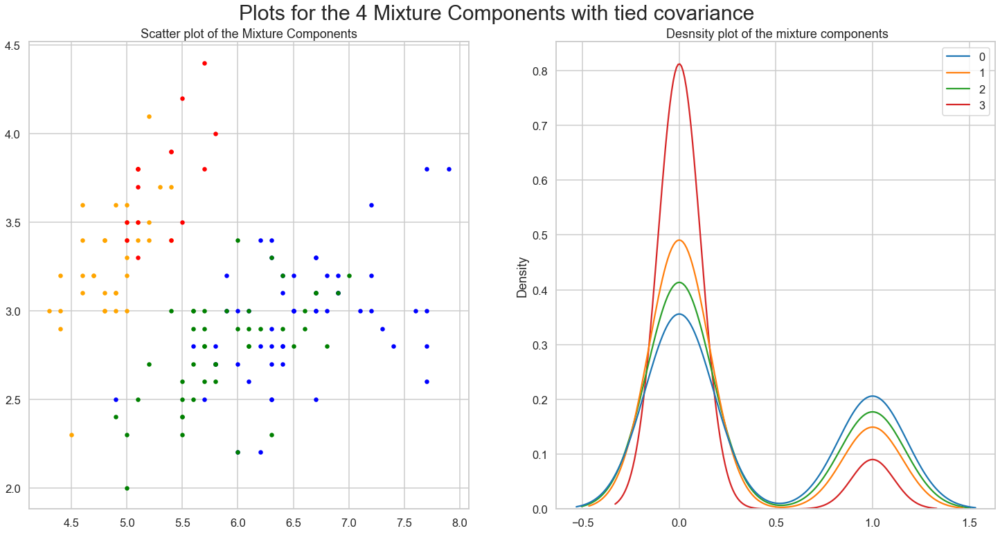

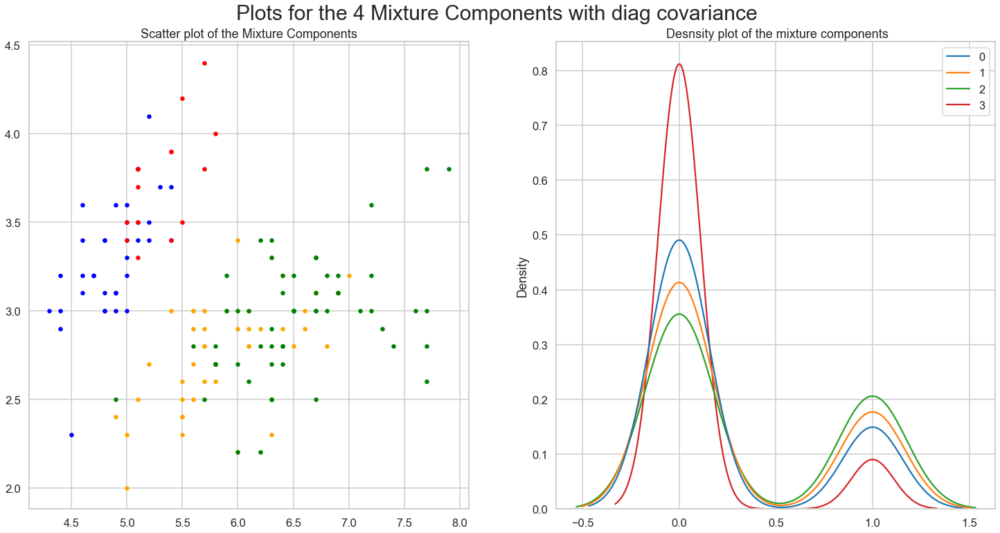

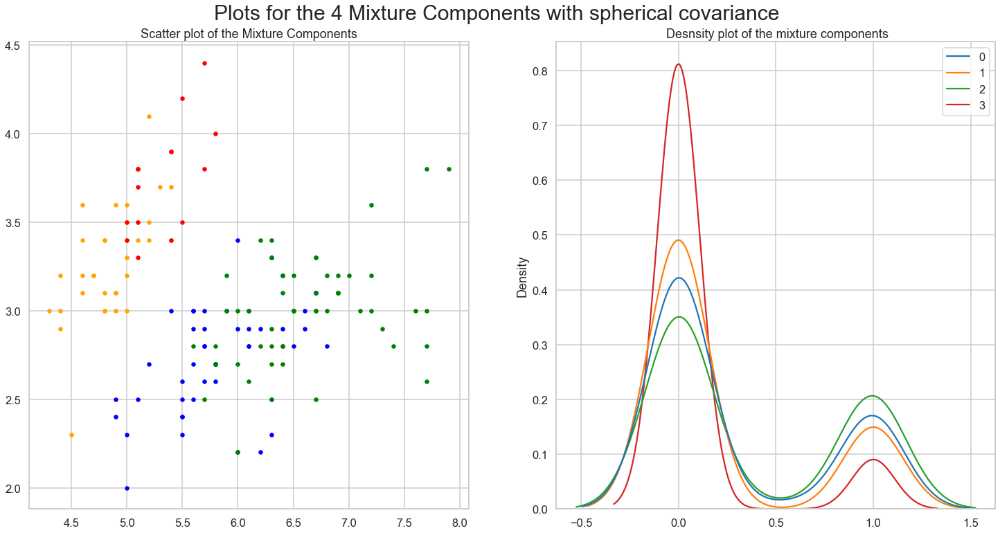

In [23]:
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_Mixture(df_rename,covars)

# Normalizing iris dataset

In [24]:
# apply MinMaxScaler for iris data set, [0, 1] for the range

df_scaled = df.copy()

# Scaling the data so that all the features become comparable using MinMax
min_max_scaler = MinMaxScaler()
df_scaled = min_max_scaler.fit_transform(df_scaled)

# Normalizing the data so that the data approximately 
# follows a Gaussian distribution
df_normalized=normalize(df_scaled)

# Converting the numpy array into a pandas DataFrame
df_normalized_dataframe = pd.DataFrame(df_normalized)

# Converting to np.arrays
df_normalized_array=np.array(df_normalized_dataframe)


In [25]:
df_normalized_dataframe.head()

,0,1,2,3
0,0.332625,0.935507,0.101479,0.062367
1,0.365686,0.914215,0.148754,0.091421
2,0.215166,0.968245,0.098466,0.080687
3,0.175319,0.964257,0.178291,0.087660
4,0.278180,0.953758,0.096992,0.059610


In [26]:
df_normalized_array

array([[0.33262469, 0.93550694, 0.10147872, 0.06236713],
       [0.36568584, 0.91421461, 0.14875356, 0.09142146],
       [0.2151655 , 0.96824477, 0.09846557, 0.08068706],
       [0.17531942, 0.96425682, 0.17829094, 0.08765971],
       [0.27817956, 0.9537585 , 0.09699239, 0.05960991],
       [0.35287181, 0.91425878, 0.13701648, 0.14435665],
       [0.13912812, 0.97389681, 0.11318898, 0.13912812],
       [0.31256303, 0.93768908, 0.13622602, 0.06697779],
       [0.07227107, 0.97565943, 0.17639041, 0.1084066 ],
       [0.33669754, 0.92591824, 0.17120214, 0.        ],
       [0.39315622, 0.9114076 , 0.10904179, 0.05361221],
       [0.22782577, 0.95686824, 0.1668148 , 0.06834773],
       [0.3125263 , 0.93757891, 0.15255521, 0.        ],
       [0.        , 0.99917368, 0.04064435, 0.        ],
       [0.44647223, 0.89294446, 0.03632316, 0.04464722],
       [0.35890857, 0.92290775, 0.07821252, 0.11536347],
       [0.35560723, 0.921346  , 0.05917655, 0.14547568],
       [0.33070081, 0.93009604,

# PCA for iris dataset

In [27]:
#Now that our data is standardized, we can perform PCA on it.

#We then create a PCA object with 2 principal components and fit the PCA model to the standardized data using the fit() method. We obtain the transformed dataset with the selected principal components using the transform() method.
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_normalized_array)


In [28]:
#convert the array to dataframe
X_pca_dataframe=pd.DataFrame(X_pca)

In [29]:
X_pca_dataframe

,0,1
0,0.639418,-0.050117
1,0.580787,-0.067287
2,0.675511,0.066520
3,0.637539,0.108972
4,0.665521,-0.000656
...,...,...
145,-0.323672,0.021630
146,-0.432020,0.006982
147,-0.304483,0.011946
148,-0.231434,0.125218


# Kmeans clustering for iris dataset after norm and PCA

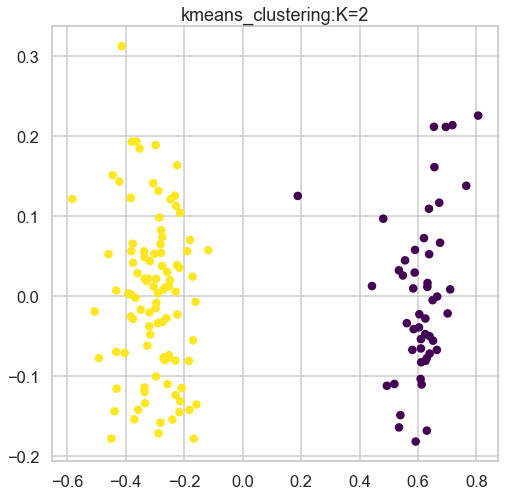

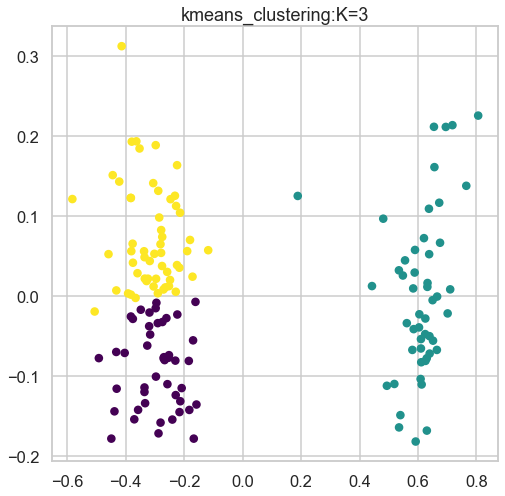

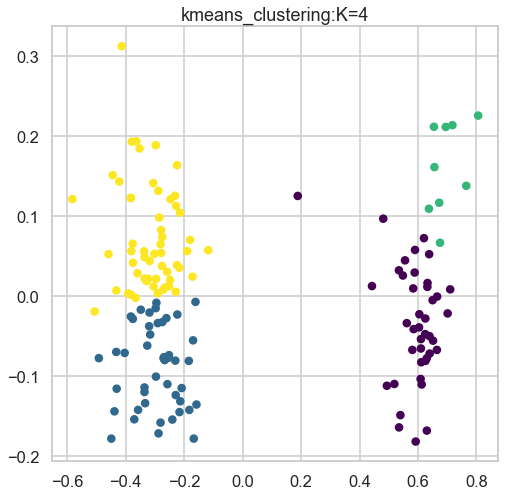

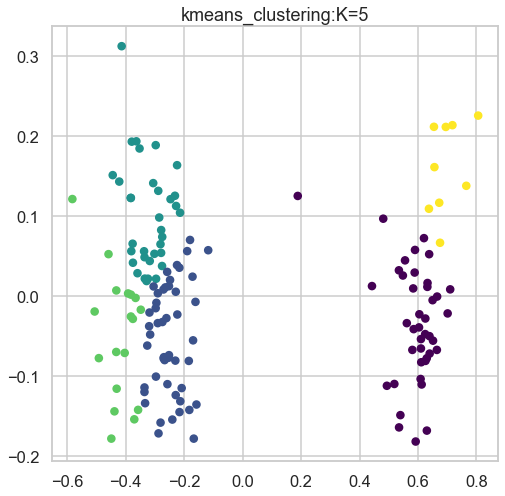

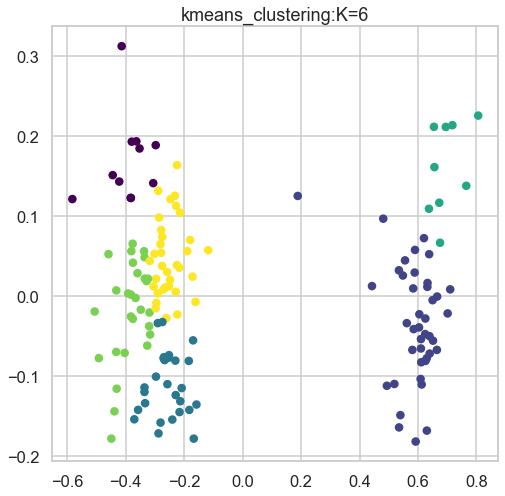

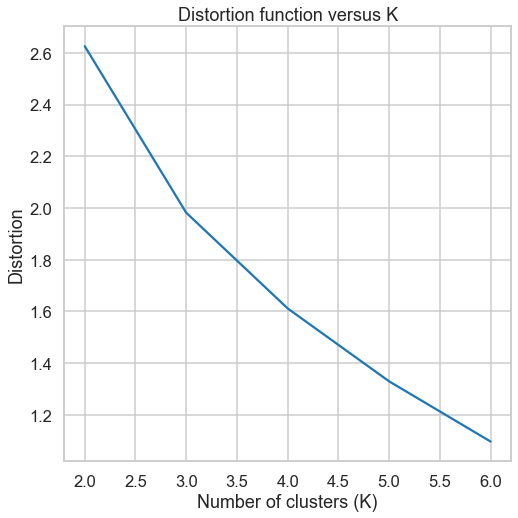

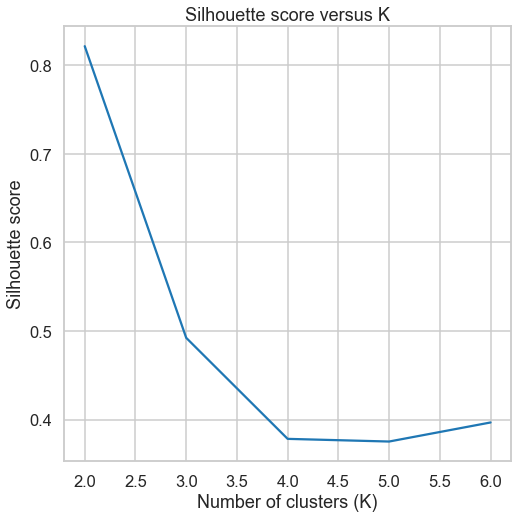

Best K from silhouette score: 2
Best value of silhouette score: 0.8213669051973818


In [30]:
kmeans_clustering(X_pca)

# Hierarchal clustering for iris dataset after norm and PCA

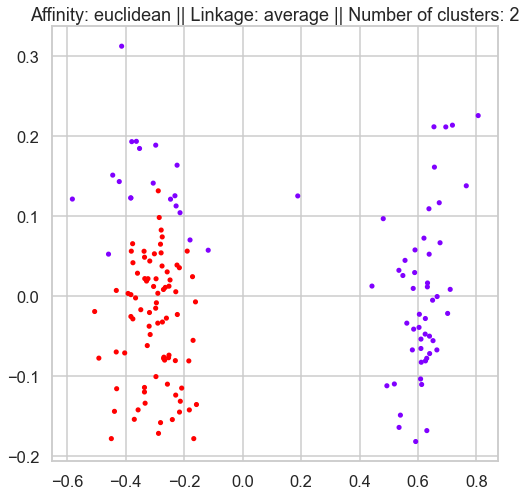

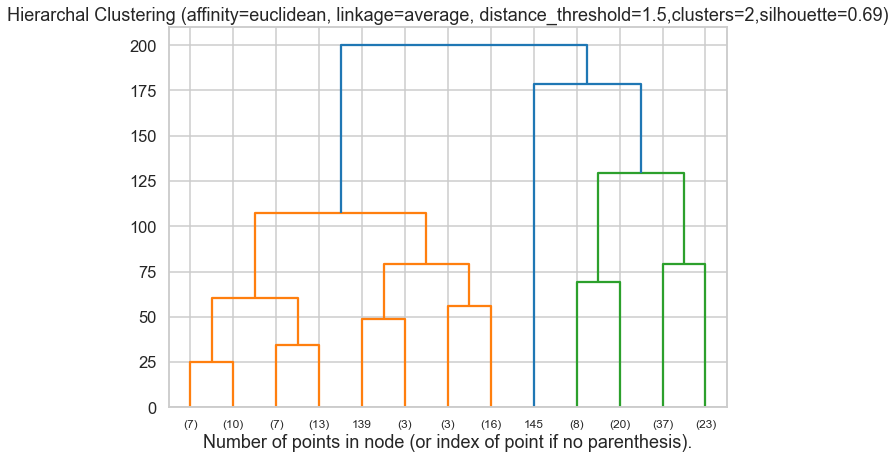

Silhouette score: 0.6907219589094225
Number of clusters: 2


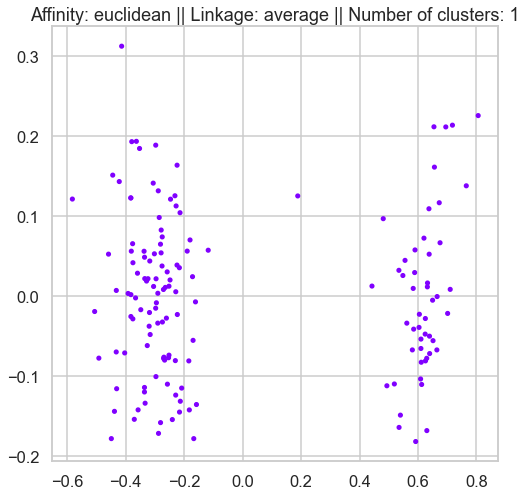

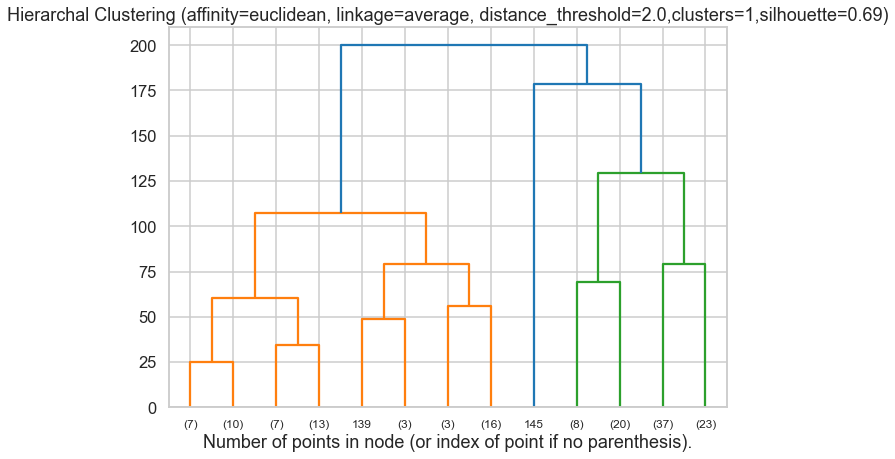

Silhouette score: 0.6907219589094225
Number of clusters: 1


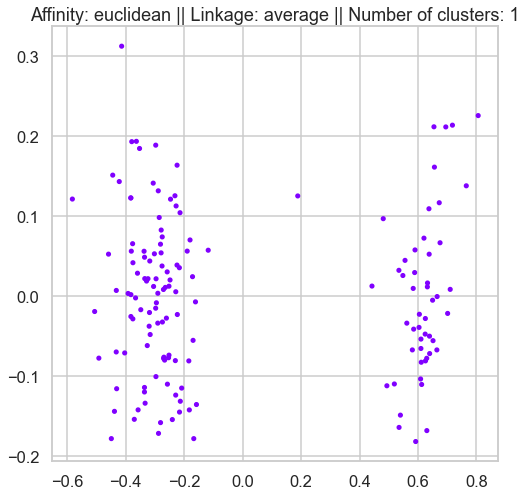

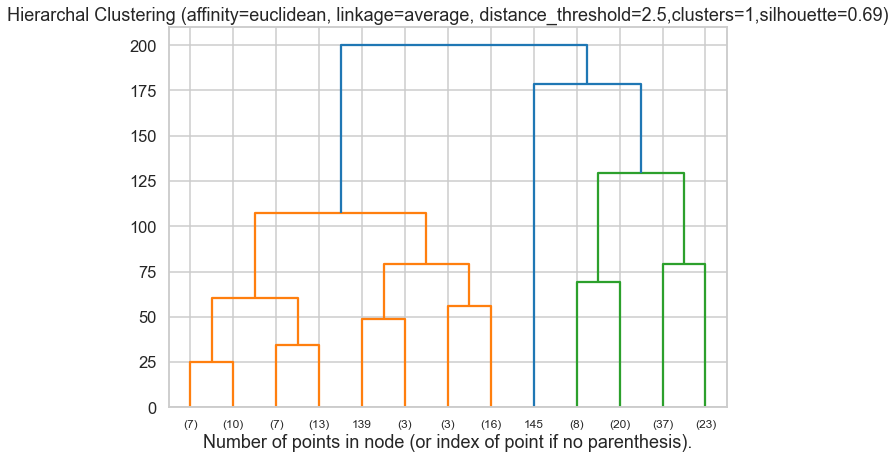

Silhouette score: 0.6907219589094225
Number of clusters: 1


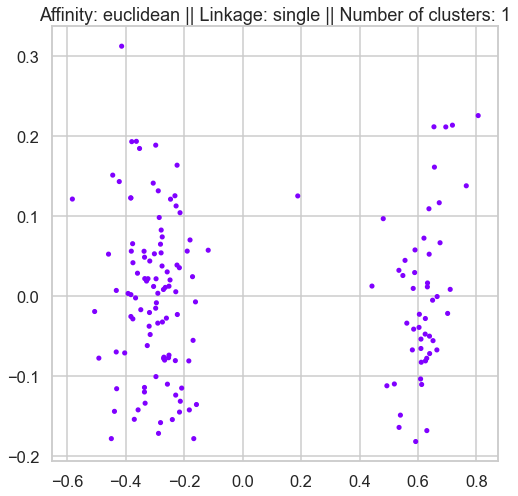

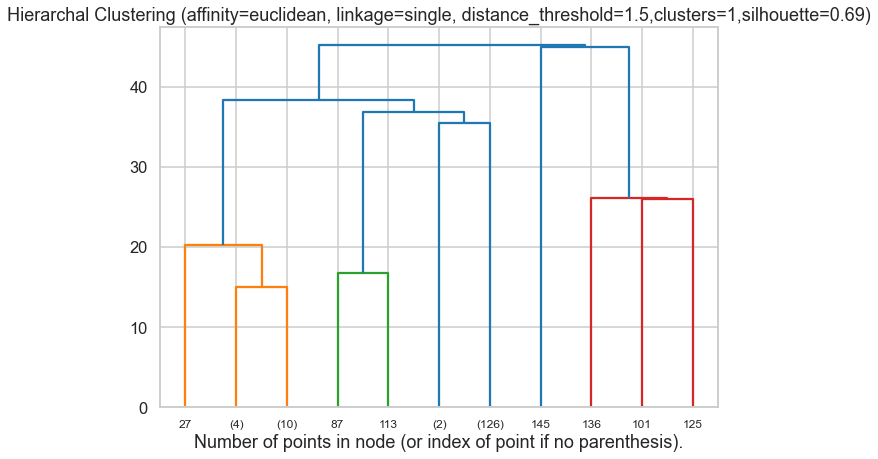

Silhouette score: 0.6907219589094225
Number of clusters: 1


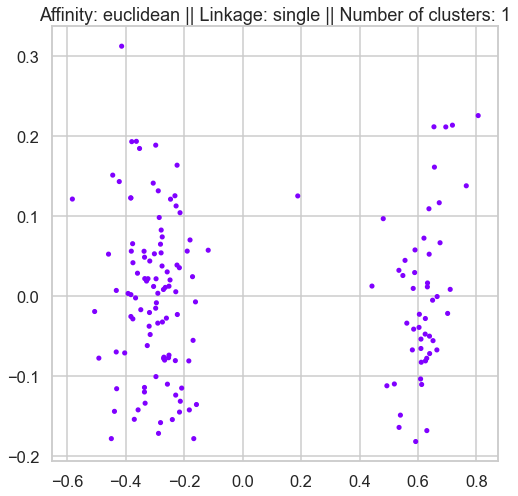

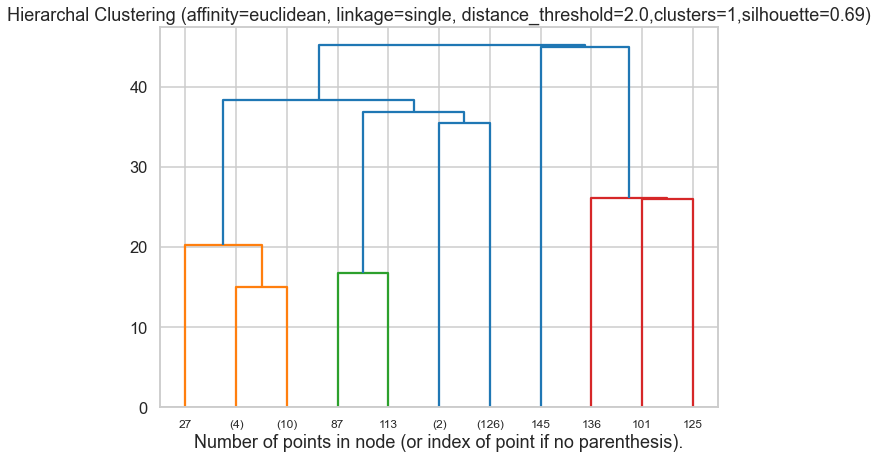

Silhouette score: 0.6907219589094225
Number of clusters: 1


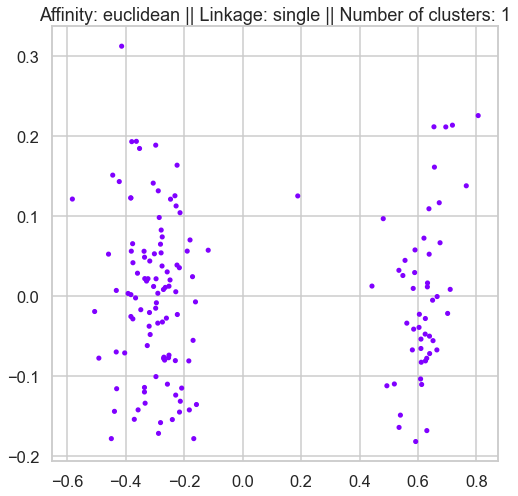

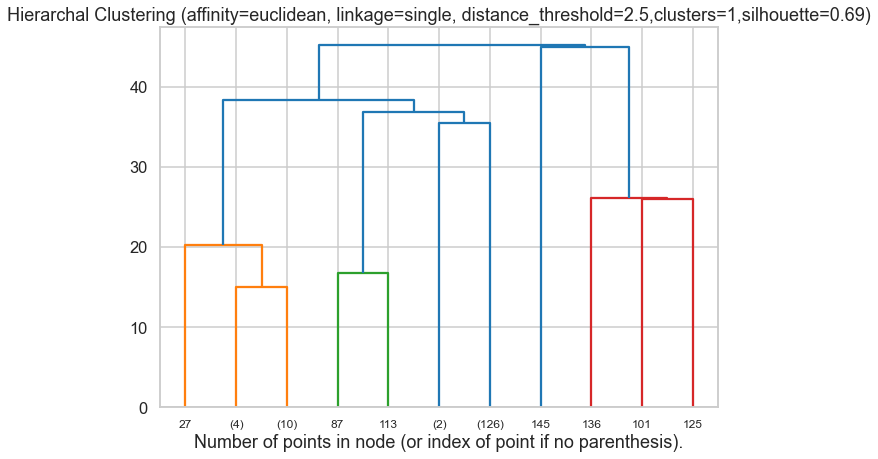

Silhouette score: 0.6907219589094225
Number of clusters: 1


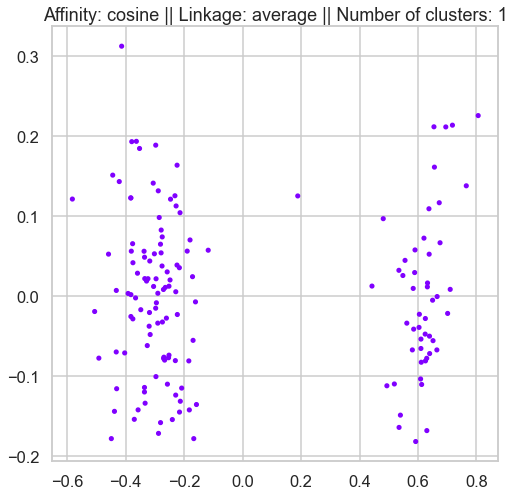

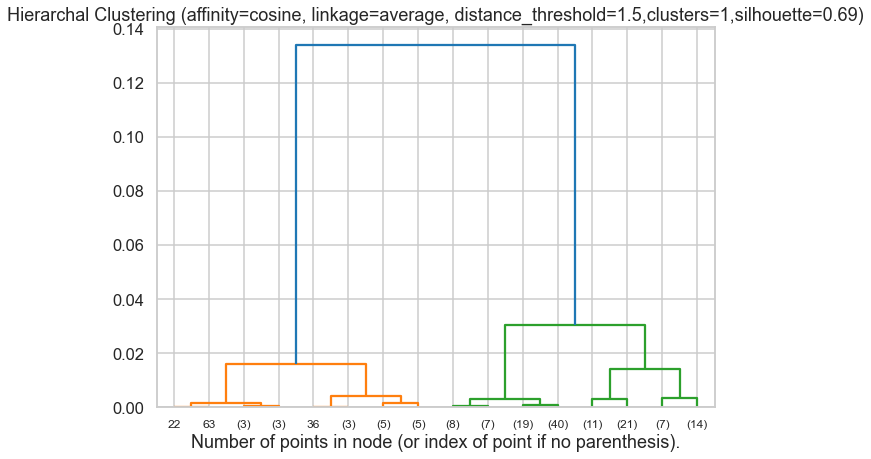

Silhouette score: 0.6907219589094225
Number of clusters: 1


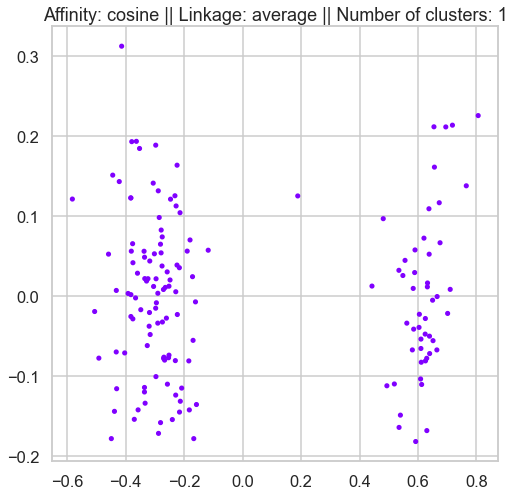

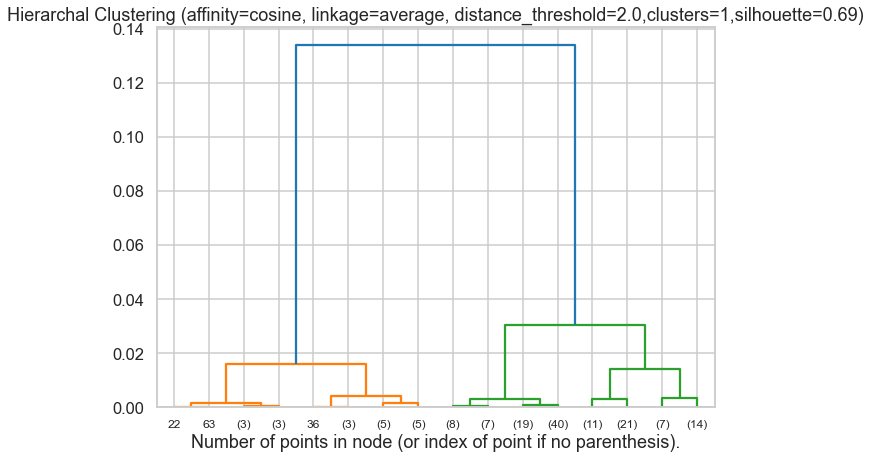

Silhouette score: 0.6907219589094225
Number of clusters: 1


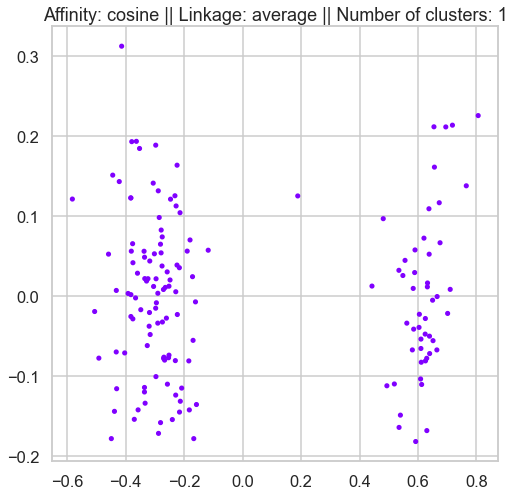

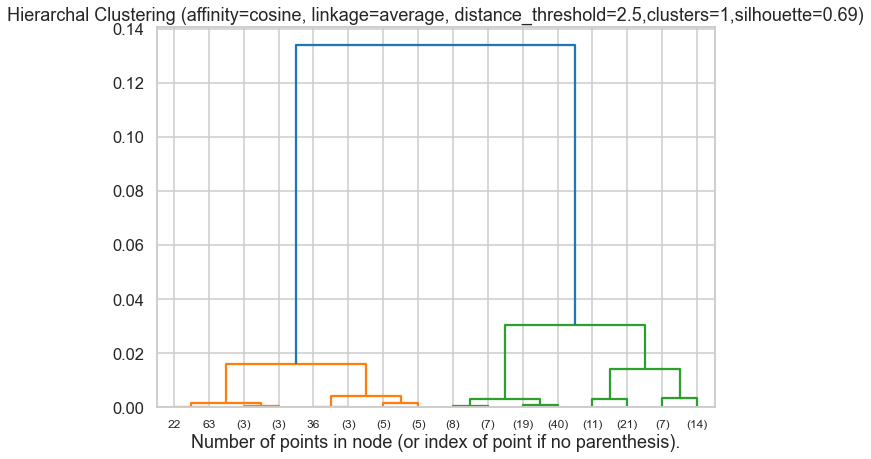

Silhouette score: 0.6907219589094225
Number of clusters: 1


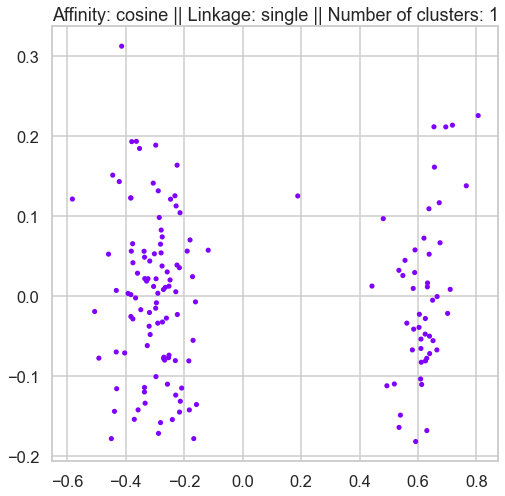

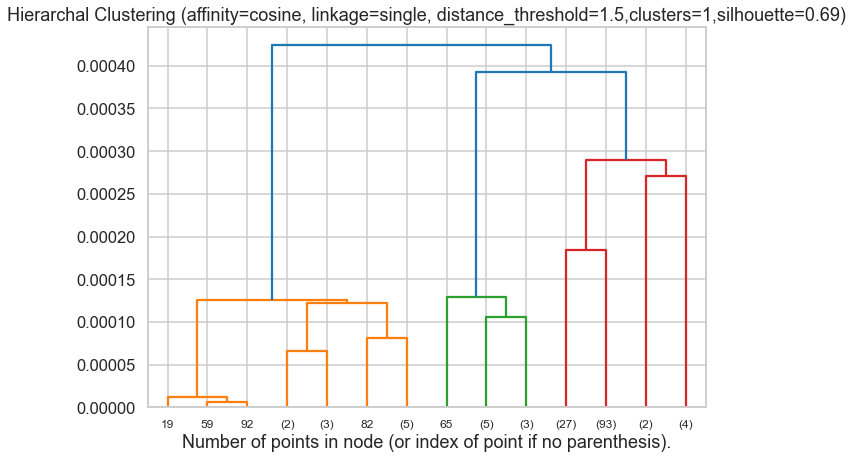

Silhouette score: 0.6907219589094225
Number of clusters: 1


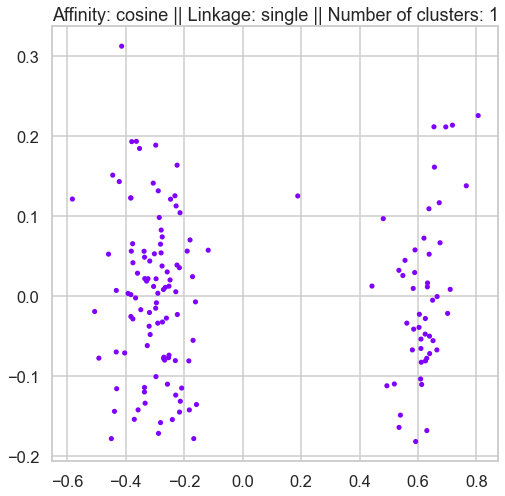

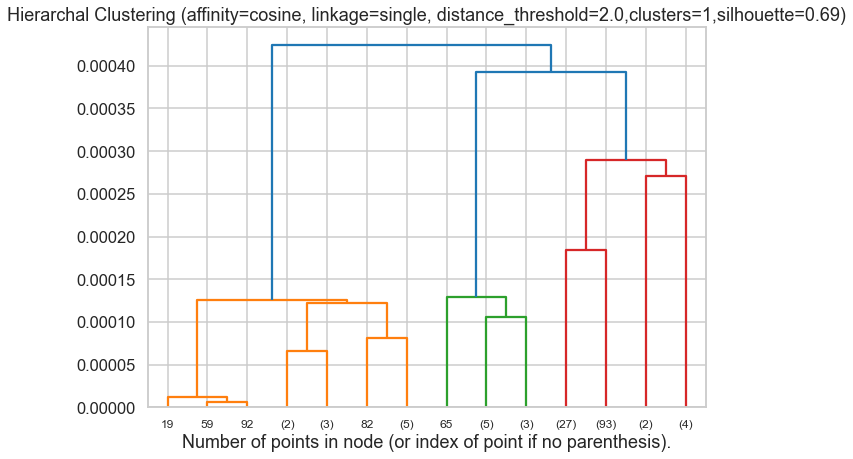

Silhouette score: 0.6907219589094225
Number of clusters: 1


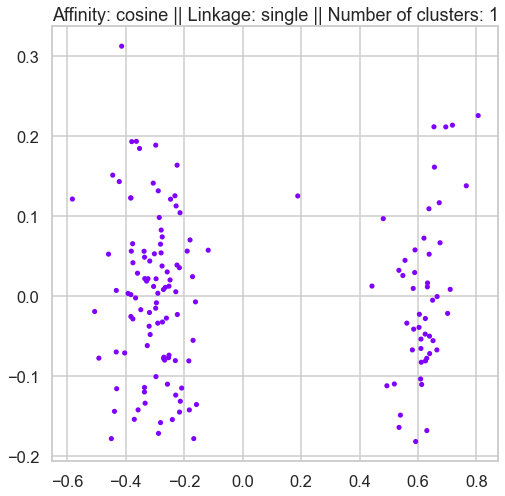

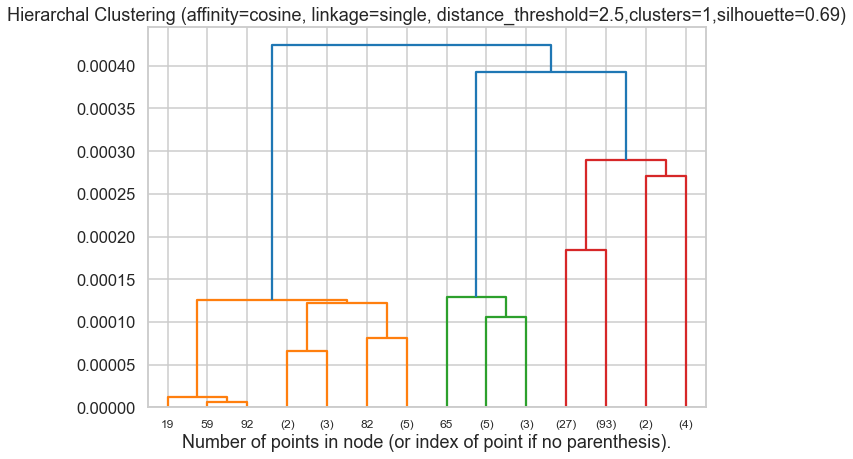

Silhouette score: 0.6907219589094225
Number of clusters: 1
Best Silhouette score: 0.6907219589094225
Number of clusters in best model: 2


In [48]:
Hierarchal_clustering(X_pca_dataframe)

# DBSCAN clustering for iris dataset after norm and PCA

Best silhouette score: 0.8213669051973818
Best eps: 0.30000000000000004
Best min_samples: 5


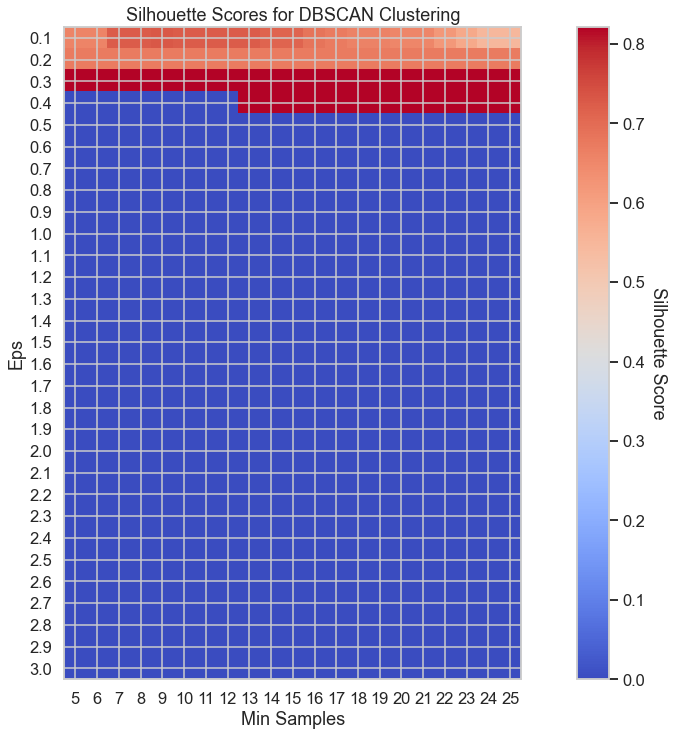

Estimated number of clusters 2 


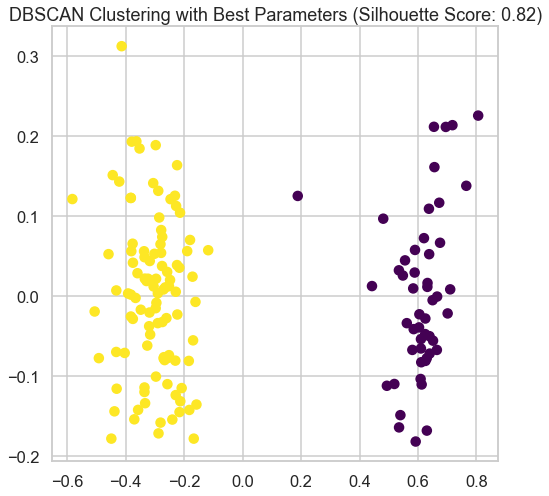

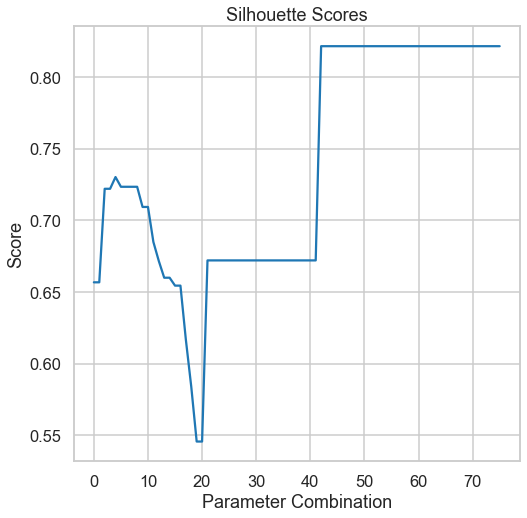

In [32]:
DBScan_clustering(X_pca_dataframe)

# GMM clustering for iris dataset after norm and PCA

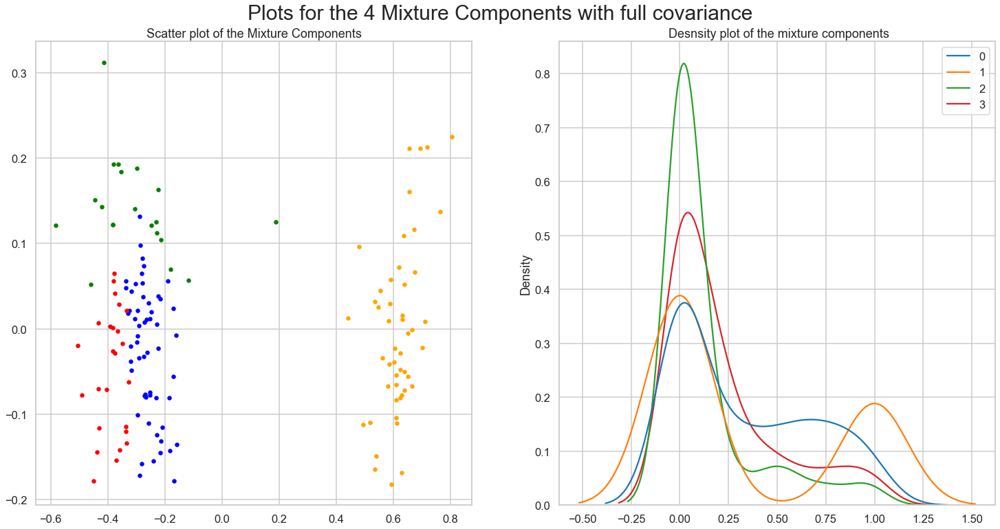

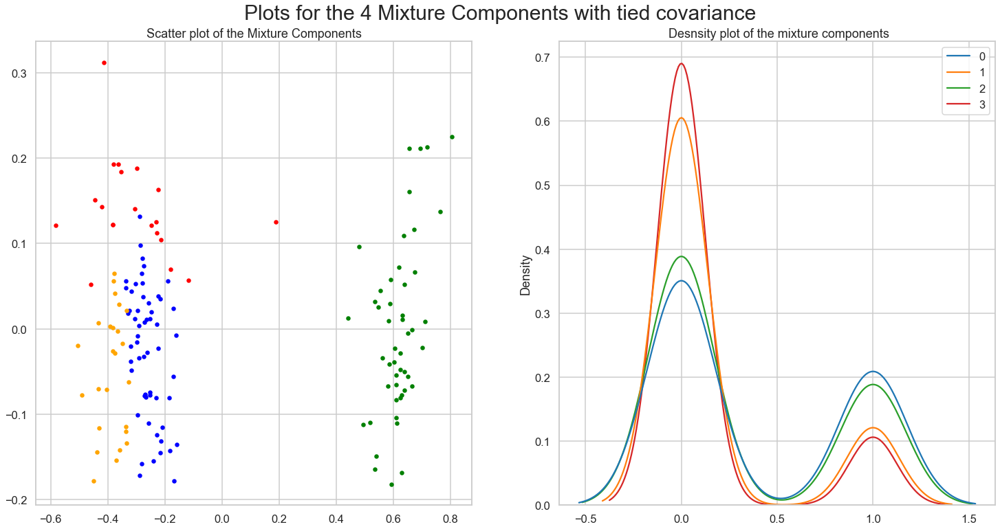

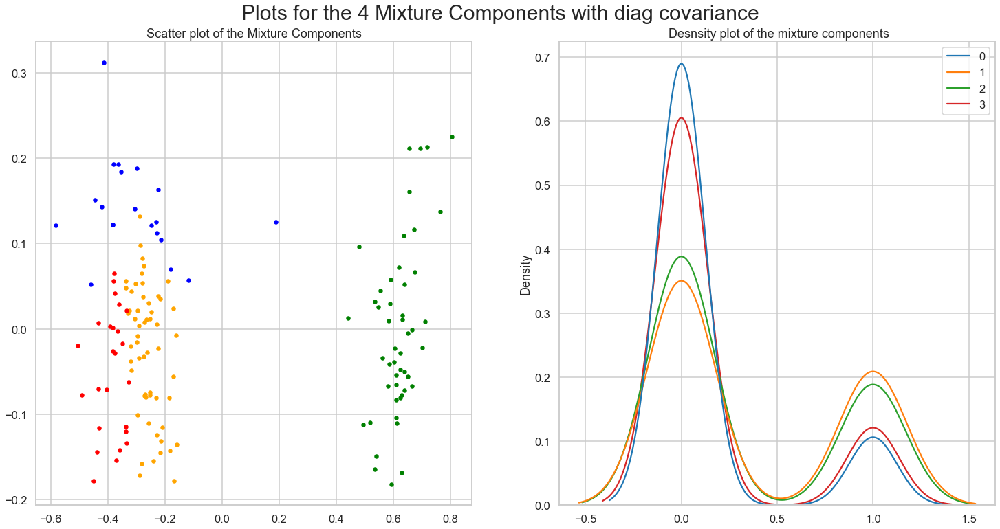

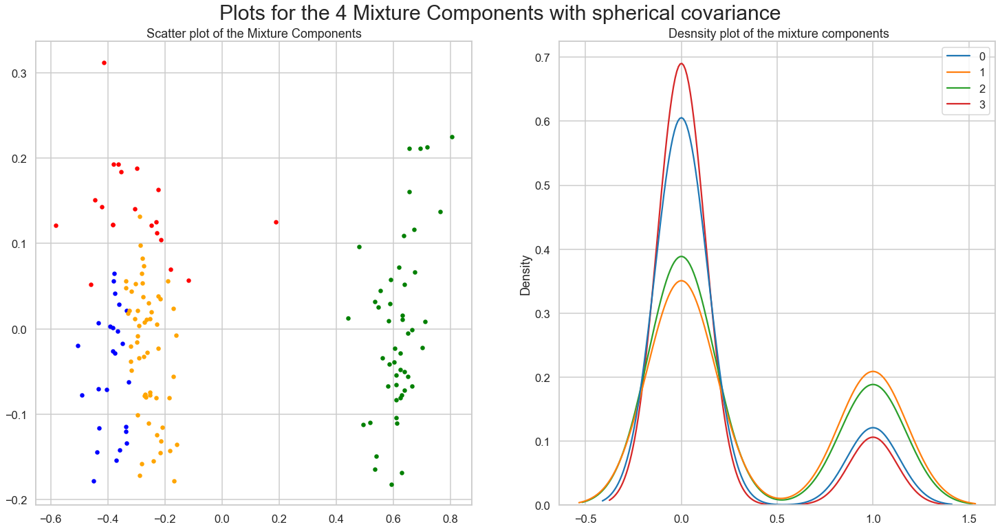

In [33]:
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_Mixture(X_pca_dataframe,covars)

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 

In [34]:
Customer_data= pd.read_csv('Customer data.csv')
df_Customer_data = pd.DataFrame(Customer_data)

In [35]:
df_Customer_data

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1
...,...,...,...,...,...,...,...,...
1995,100001996,1,0,47,1,123525,0,0
1996,100001997,1,1,27,1,117744,1,0
1997,100001998,0,0,31,0,86400,0,0
1998,100001999,1,1,24,1,97968,0,0


In [36]:
df_Customer_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   ID               2000 non-null   int64
 1   Sex              2000 non-null   int64
 2   Marital status   2000 non-null   int64
 3   Age              2000 non-null   int64
 4   Education        2000 non-null   int64
 5   Income           2000 non-null   int64
 6   Occupation       2000 non-null   int64
 7   Settlement size  2000 non-null   int64
dtypes: int64(8)
memory usage: 125.1 KB


# Normalizing the Customer dataset

In [37]:
# apply MinMaxScaler for iris data set, [0, 1] for the range
from sklearn.preprocessing import MinMaxScaler
df_scaled_customer_data = df_Customer_data.copy()

# Scaling the data so that all the features become comparable using MinMax
min_max_scaler = MinMaxScaler()
df_scaled_customer_data = min_max_scaler.fit_transform(df_scaled_customer_data)

# Normalizing the data so that the data approximately 
# follows a Gaussian distribution
df_normalized_customer_data=normalize(df_scaled_customer_data)

# Converting the numpy array into a pandas DataFrame
df_normalized_dataframe_customer_data = pd.DataFrame(df_scaled_customer_data)

# Converting dataframe to np.arrays
df_normalized_array_customer_data=np.array(df_normalized_dataframe_customer_data)


In [38]:
df_normalized_array_customer_data

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        3.24781013e-01, 5.00000000e-01, 1.00000000e+00],
       [5.00250120e-04, 1.00000000e+00, 1.00000000e+00, ...,
        4.20210432e-01, 5.00000000e-01, 1.00000000e+00],
       [1.00050025e-03, 0.00000000e+00, 0.00000000e+00, ...,
        1.95143530e-01, 0.00000000e+00, 0.00000000e+00],
       ...,
       [9.98999500e-01, 0.00000000e+00, 0.00000000e+00, ...,
        1.84870509e-01, 0.00000000e+00, 0.00000000e+00],
       [9.99499750e-01, 1.00000000e+00, 1.00000000e+00, ...,
        2.27161721e-01, 0.00000000e+00, 0.00000000e+00],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.19123174e-01, 0.00000000e+00, 0.00000000e+00]])

In [39]:
df_normalized_dataframe_customer_data

,0,1,2,3,4,5,6,7
0,0.000000,0.0,0.0,0.844828,0.666667,0.324781,0.5,1.0
1,0.000500,1.0,1.0,0.068966,0.333333,0.420210,0.5,1.0
2,0.001001,0.0,0.0,0.534483,0.333333,0.195144,0.0,0.0
3,0.001501,0.0,0.0,0.465517,0.333333,0.496223,0.5,0.5
4,0.002001,0.0,0.0,0.603448,0.333333,0.413842,0.5,0.5
...,...,...,...,...,...,...,...,...
1995,0.997999,1.0,0.0,0.500000,0.333333,0.320595,0.0,0.0
1996,0.998499,1.0,1.0,0.155172,0.333333,0.299460,0.5,0.0
1997,0.998999,0.0,0.0,0.224138,0.000000,0.184871,0.0,0.0
1998,0.999500,1.0,1.0,0.103448,0.333333,0.227162,0.0,0.0


# PCA for Customer Dataset

In [40]:
#Now that our data is standardized, we can perform PCA on it.

pca_customer_data = PCA(n_components=2)
X_pca_customer_data = pca_customer_data.fit_transform(df_normalized_array_customer_data)


In [41]:
# print the explained variance of each principal component
print(pca.explained_variance_ratio_)

[0.928563   0.04816961]


In [42]:
X_pca_dataframe_customer_data=pd.DataFrame(X_pca_customer_data)

In [43]:
X_pca_dataframe_customer_data

,0,1
0,0.908215,0.404591
1,-0.411031,0.856575
2,0.539345,-0.566031
3,0.778703,0.047991
4,0.783364,0.038253
...,...,...
1995,-0.301370,-0.782678
1996,-0.865255,-0.085925
1997,0.380732,-0.882295
1998,-0.955085,-0.335119


# Kmeans for Normalized Customer Dataset

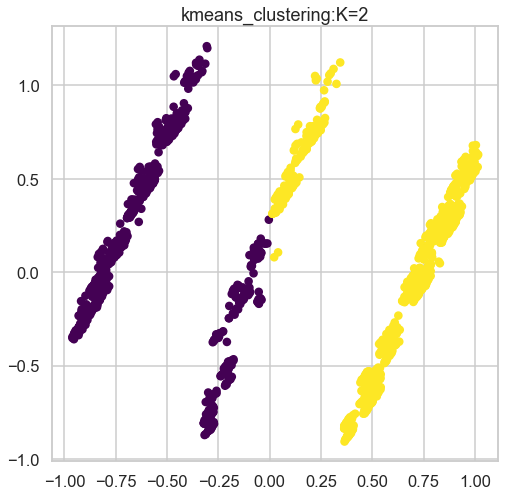

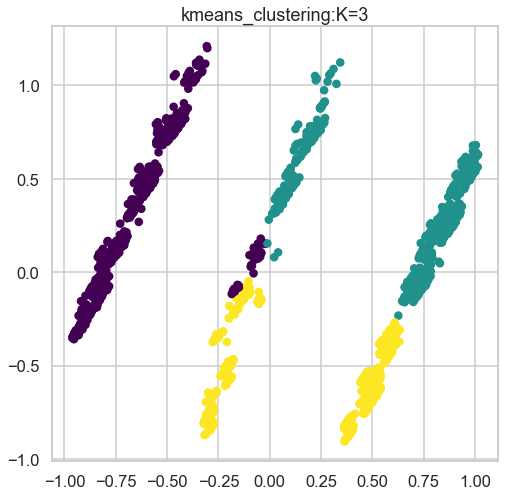

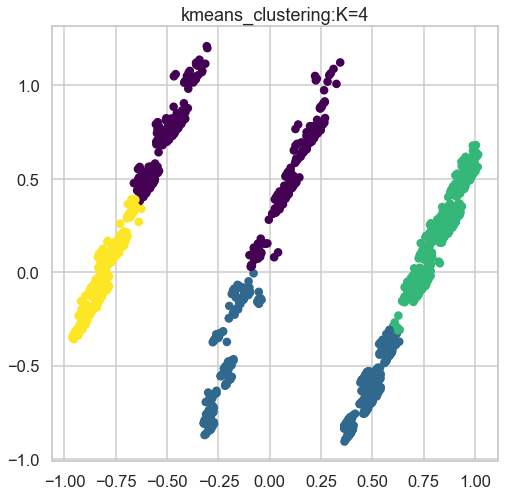

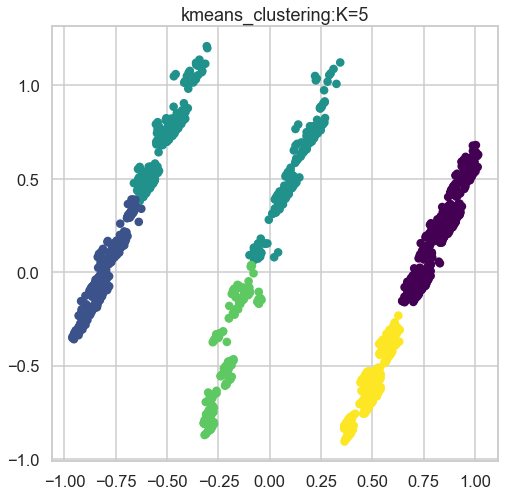

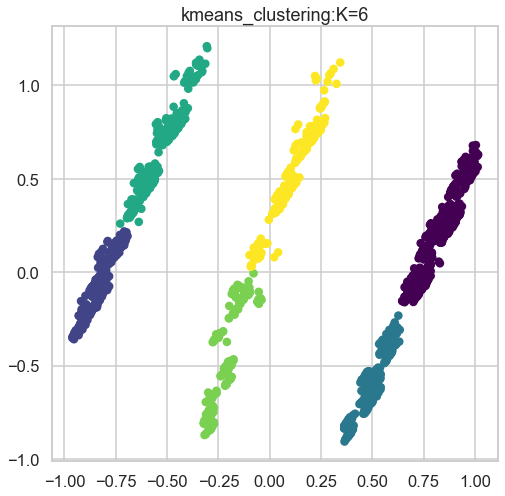

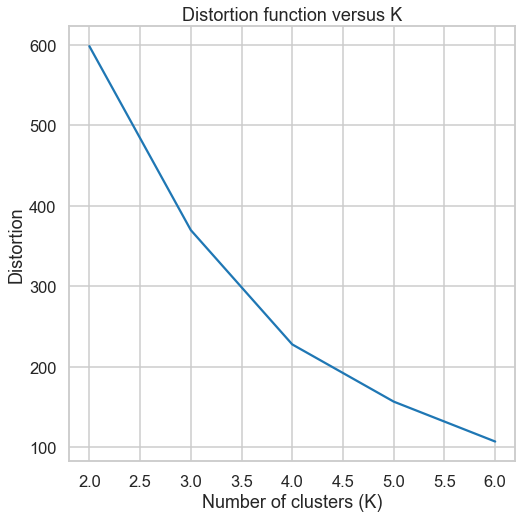

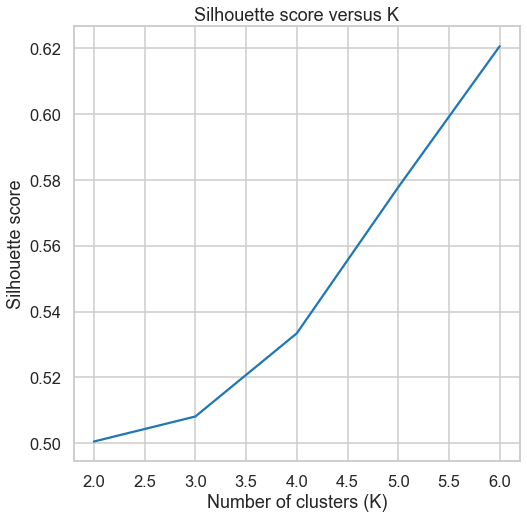

Best K from silhouette score: 6
Best value of silhouette score: 0.6205733438326747


In [44]:
kmeans_clustering(X_pca_customer_data)

# DBSCAN to cluster Normalized Customer Dataset

Best silhouette score: 0.5008034563904239
Best eps: 0.6
Best min_samples: 5


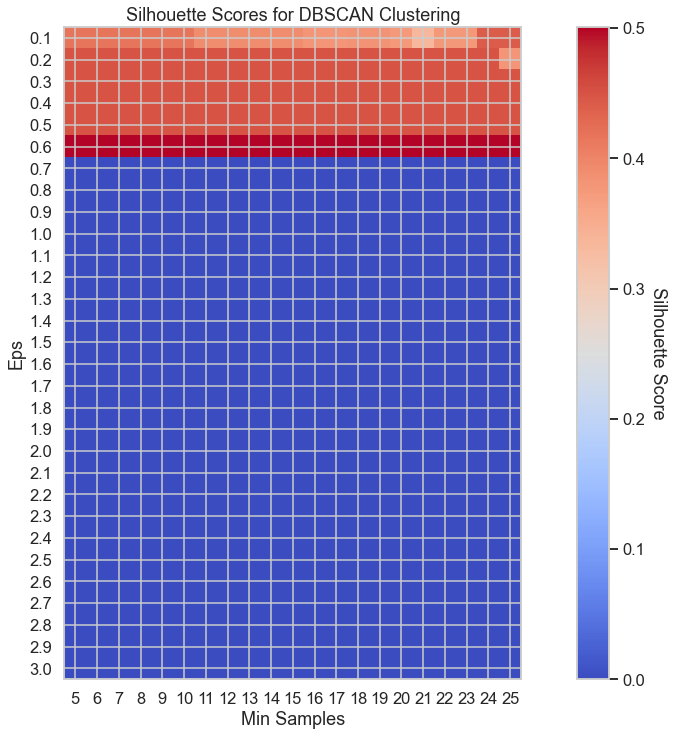

Estimated number of clusters 2 


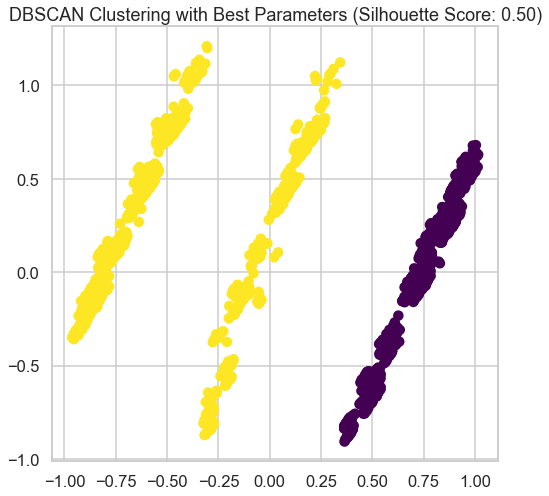

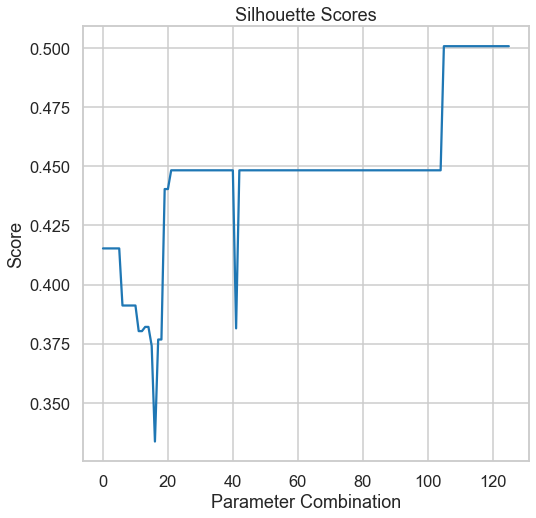

In [45]:
DBScan_clustering(X_pca_dataframe_customer_data)

# Hierarchal Clustering to cluster Normalized Customer Dataset

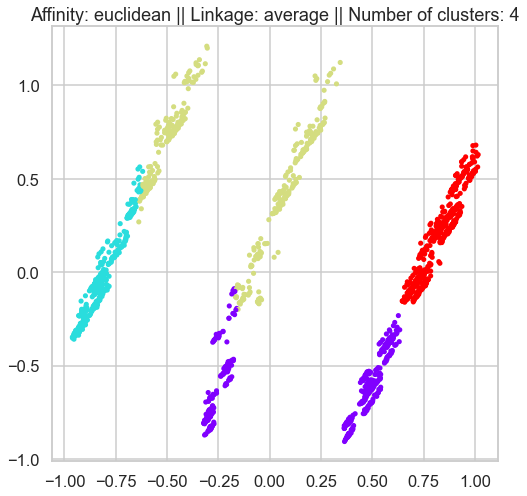

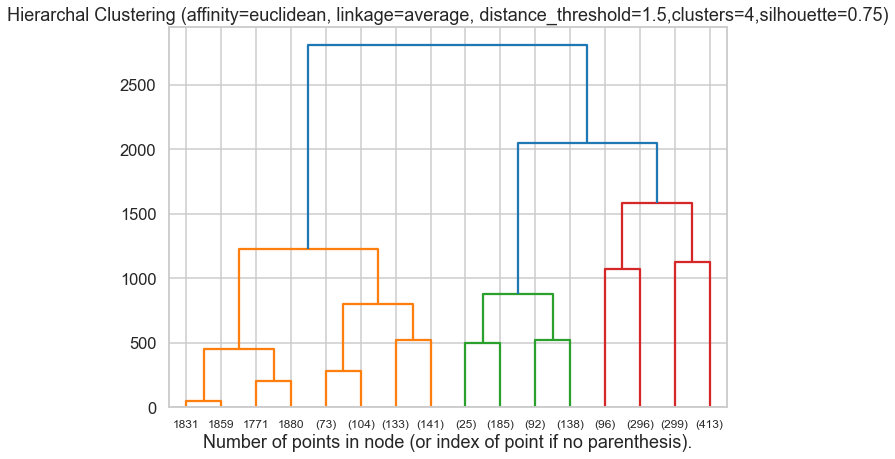

Silhouette score: 0.7537464033447638
Number of clusters: 4


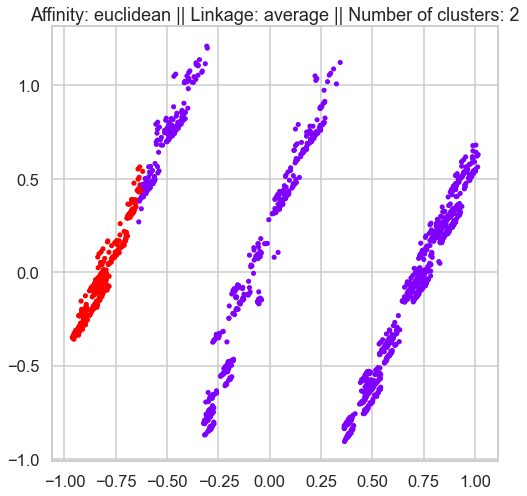

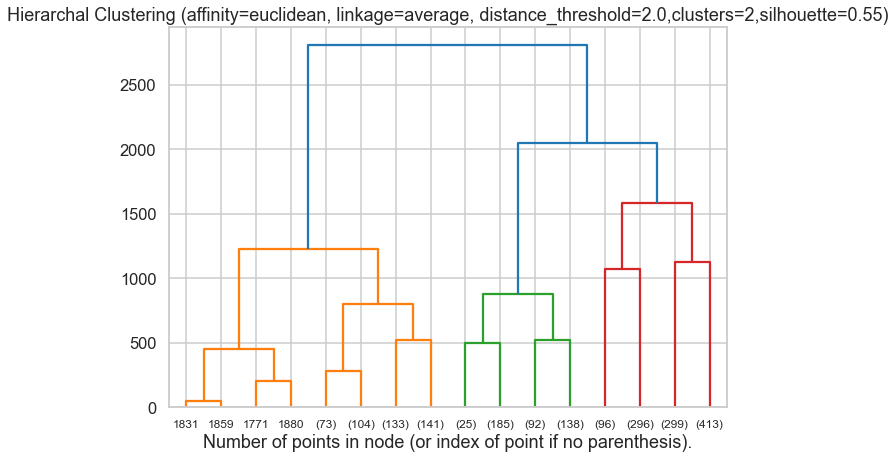

Silhouette score: 0.5451465395973945
Number of clusters: 2


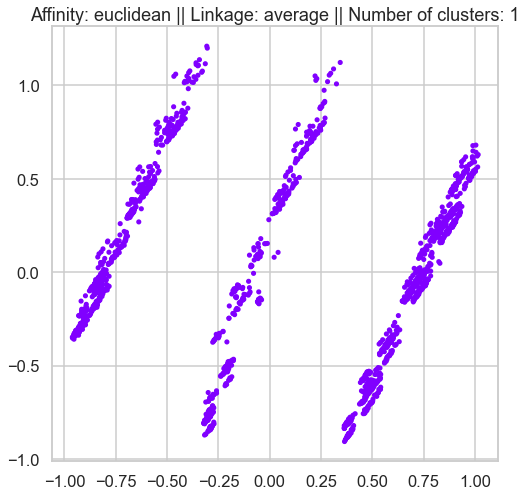

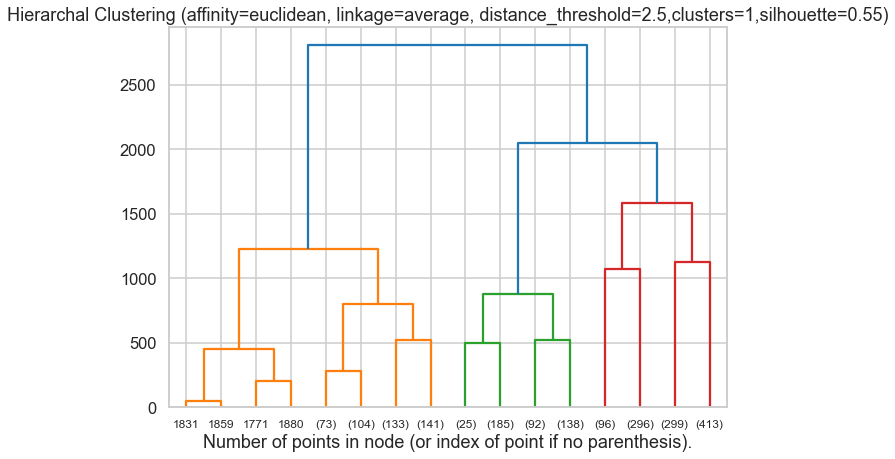

Silhouette score: 0.5451465395973945
Number of clusters: 1


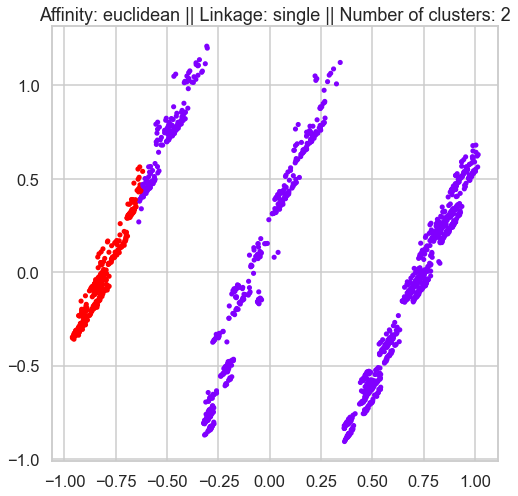

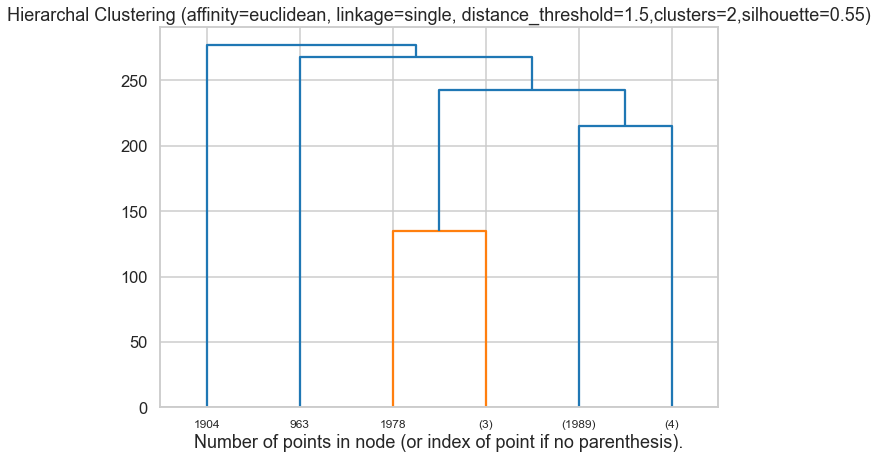

Silhouette score: 0.5451465395973945
Number of clusters: 2


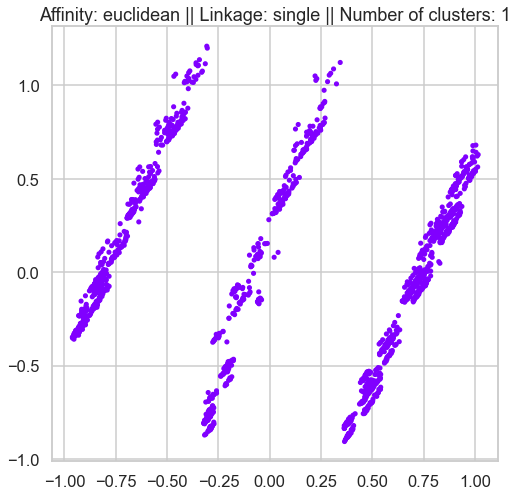

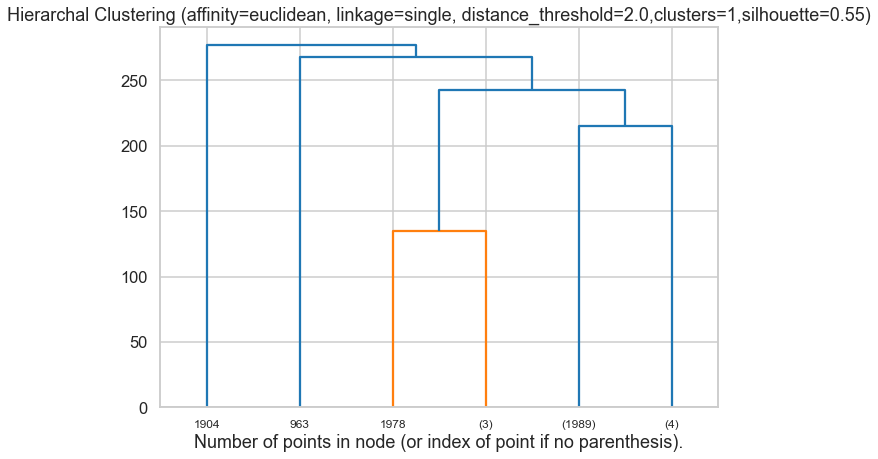

Silhouette score: 0.5451465395973945
Number of clusters: 1


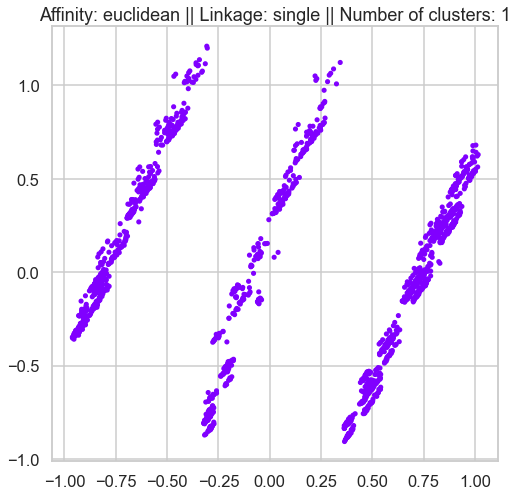

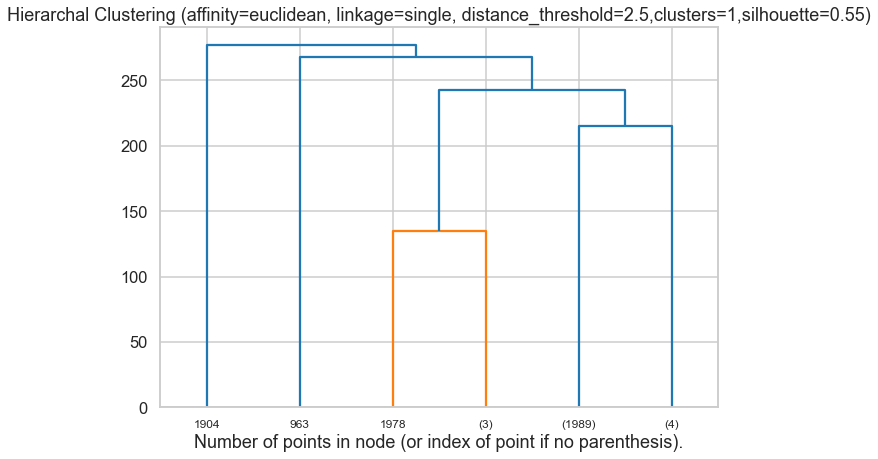

Silhouette score: 0.5451465395973945
Number of clusters: 1


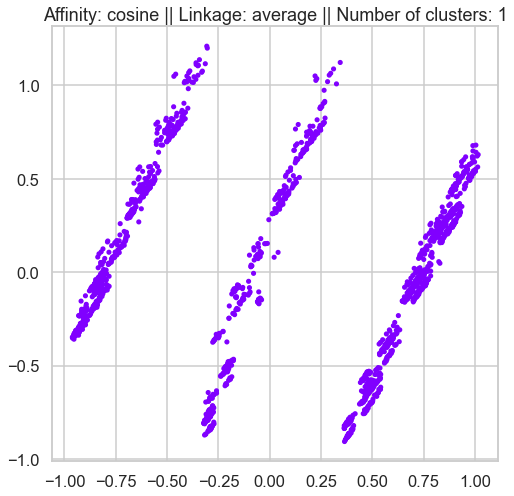

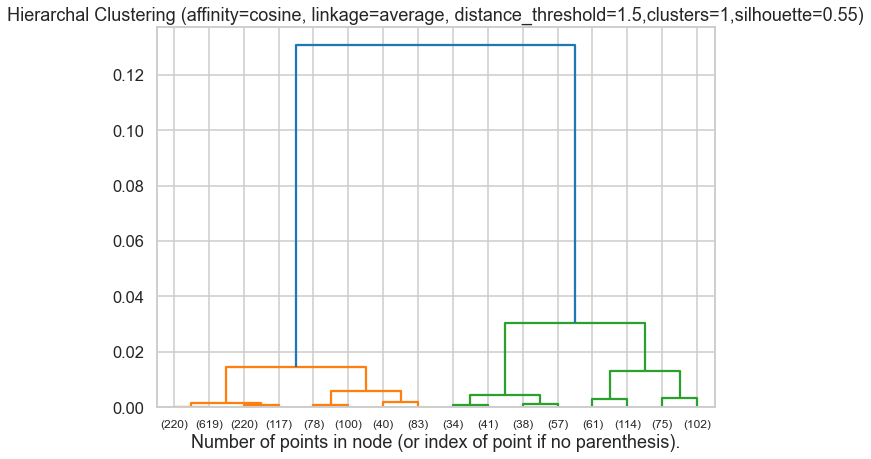

Silhouette score: 0.5451465395973945
Number of clusters: 1


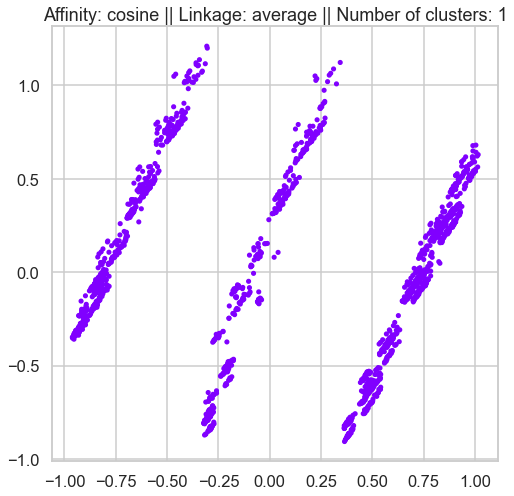

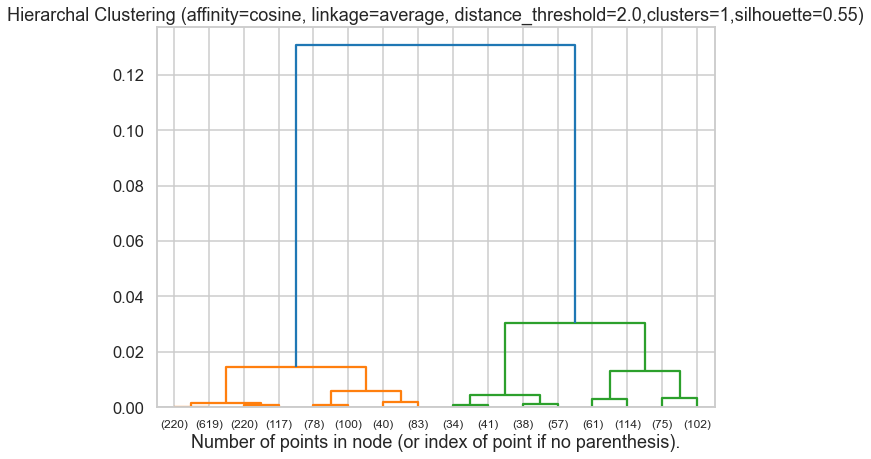

Silhouette score: 0.5451465395973945
Number of clusters: 1


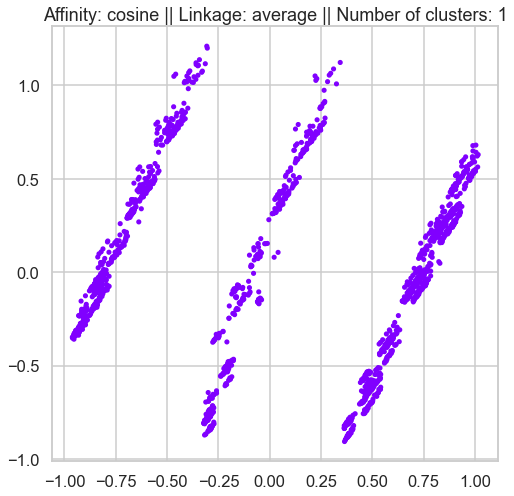

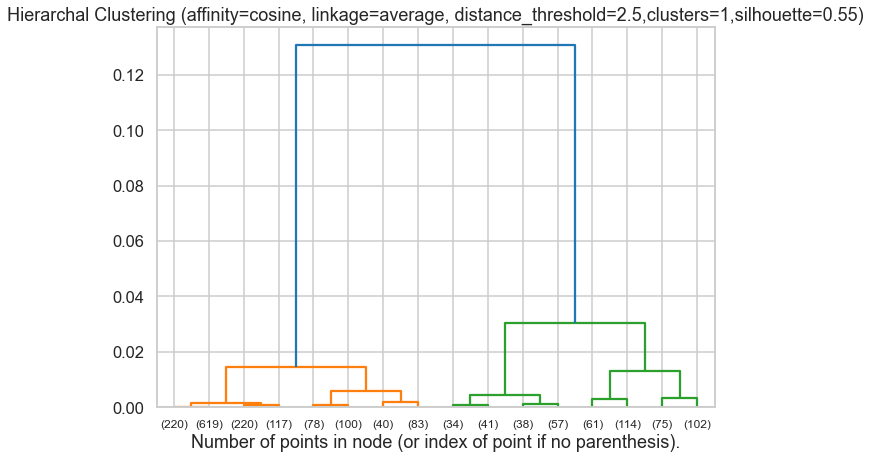

Silhouette score: 0.5451465395973945
Number of clusters: 1


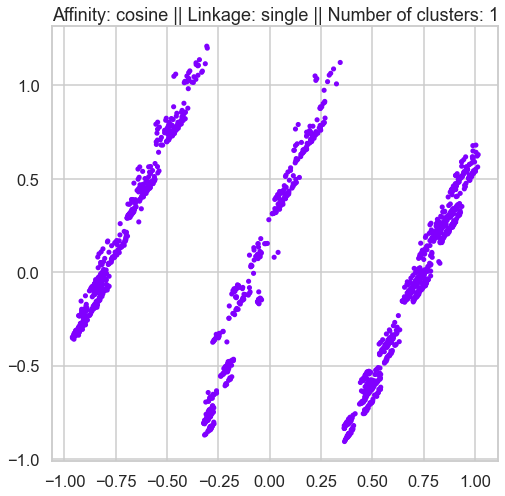

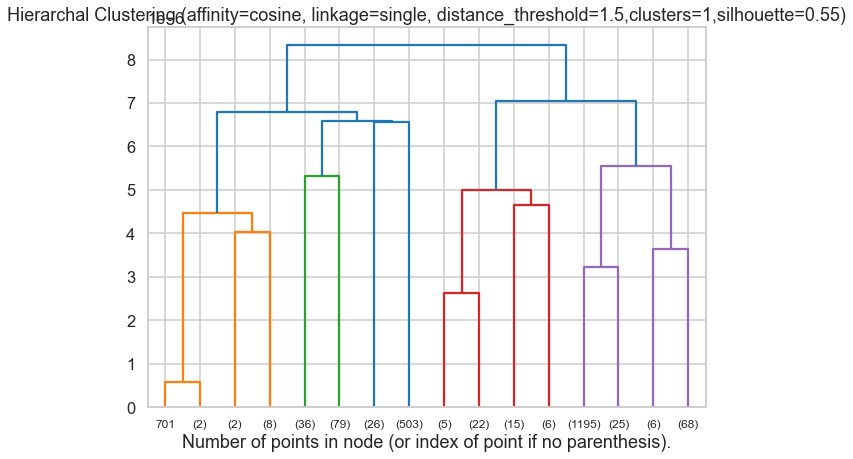

Silhouette score: 0.5451465395973945
Number of clusters: 1


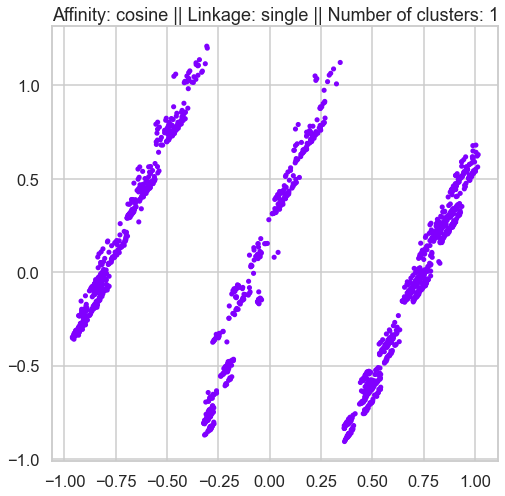

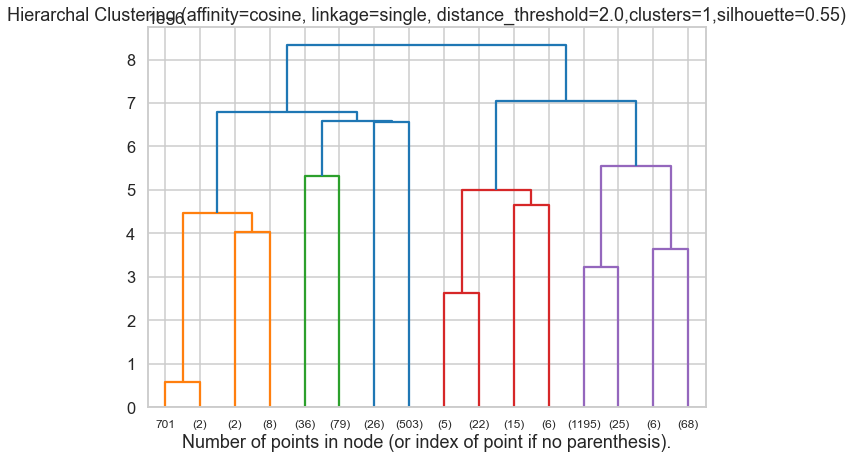

Silhouette score: 0.5451465395973945
Number of clusters: 1


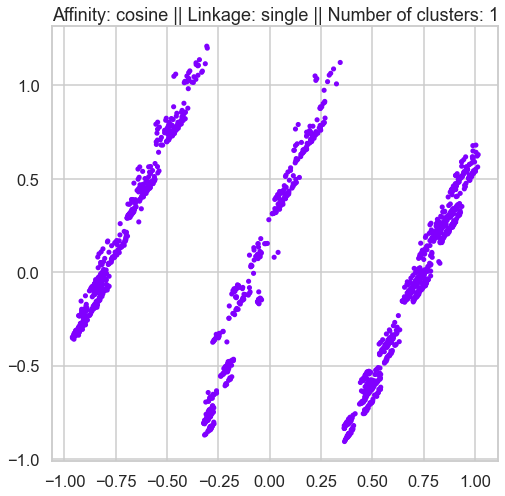

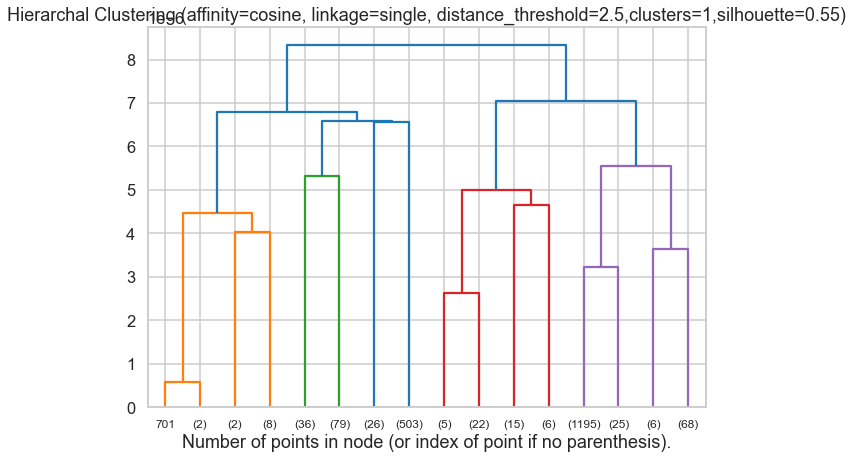

Silhouette score: 0.5451465395973945
Number of clusters: 1
Best Silhouette score: 0.7537464033447638
Number of clusters in best model: 4


In [49]:
Hierarchal_clustering(X_pca_dataframe_customer_data)

# Gaussian Mixture to cluster Normalized Customer Dataset

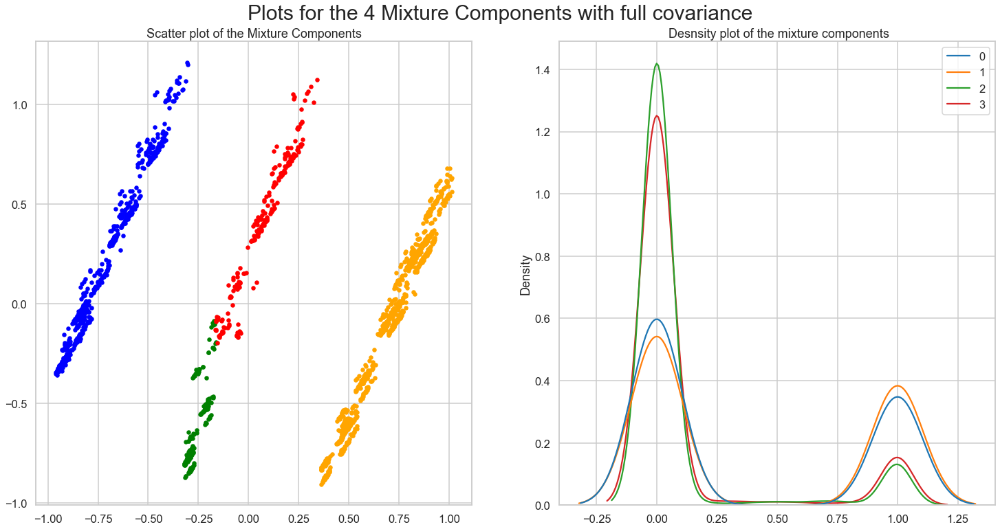

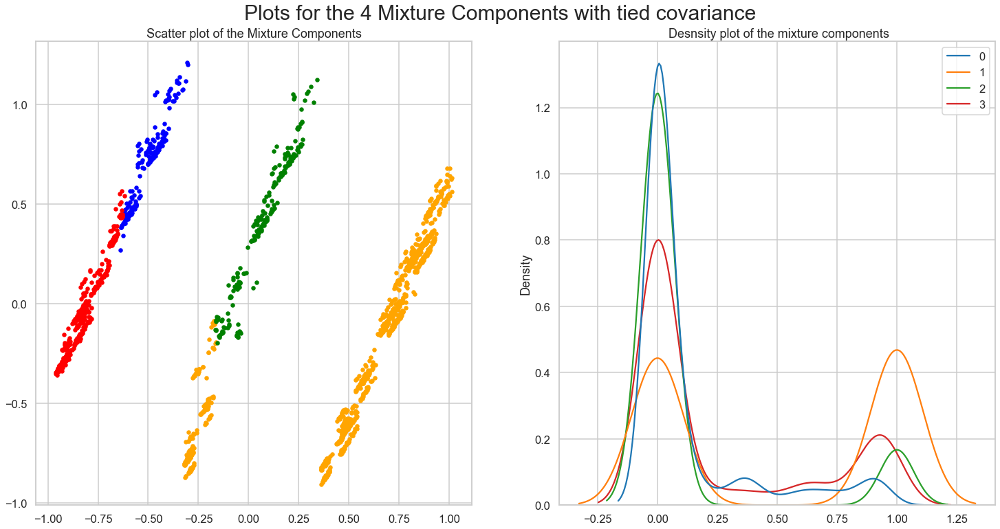

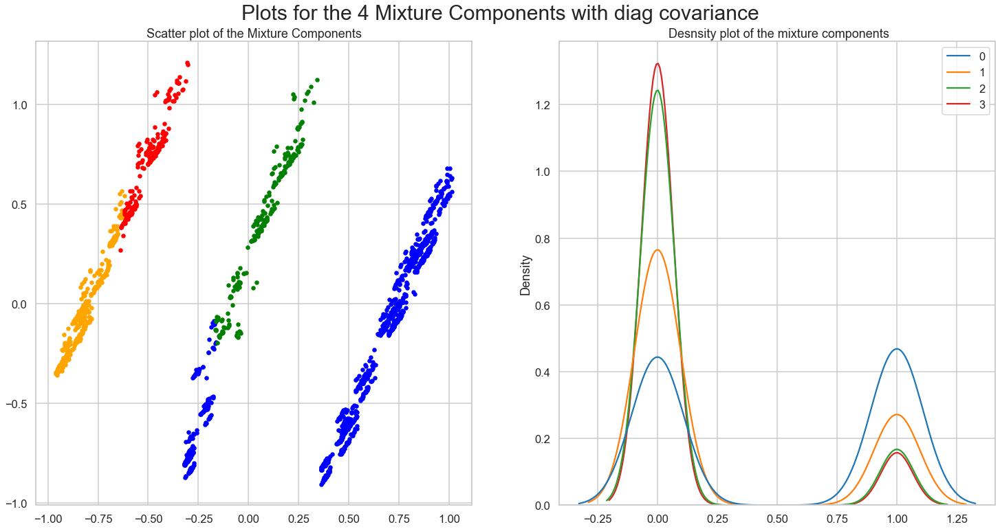

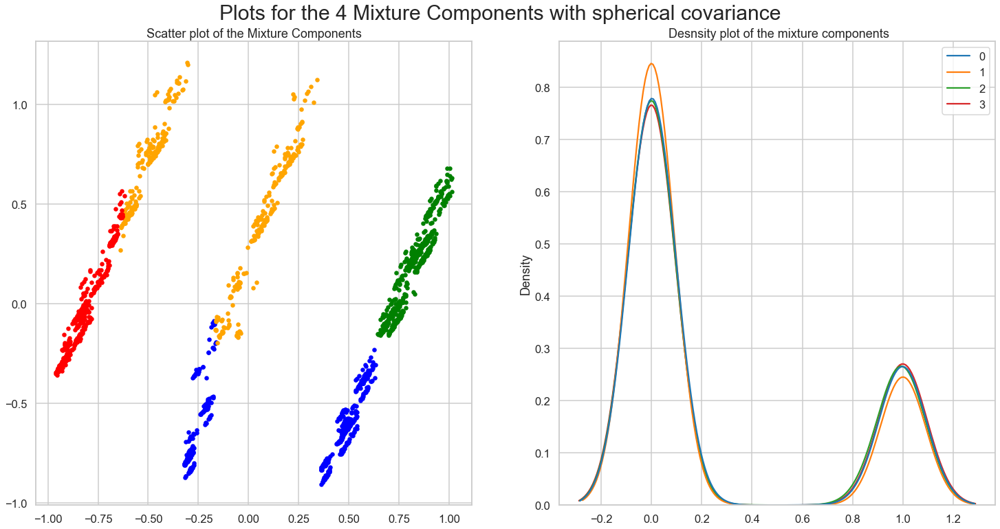

In [47]:
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_Mixture(X_pca_dataframe_customer_data,covars)